## 목표
#### DTW를 이용한 Well Correlation 분석
#### 파이프 라인 구축

In [2]:
# install package for DTW
!pip install dtwalign

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 1.1 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 4.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.5/25.5 MB 4.3 MB/s eta 0:00:0000:0100:01


In [159]:
# import libraries
import pandas as pd
import numpy as np
import glob
import os
import math
from itertools import chain, repeat
import shutil #used to zip predictions for submission

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="ticks")

from dtwalign import dtw
from dtwalign import dtw_from_distance_matrix
from scipy.ndimage import gaussian_filter
from scipy import interpolate

# import sklearn libararies
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

import xgboost
import lightgbm
import dtw

np.random.seed(10)

## 데이터 불러오기

In [160]:
well_list = os.listdir('data/train/')

if '.DS_Store' in well_list:
    well_list.remove('.DS_Store')

per_well = []

for i in well_list:
    well = pd.read_csv('data/train/{}'.format(i))
    well['log_RD'] = np.log10(well['RD'])
    well['well'] = i.split('_')[-1].split('.')[0]
    per_well.append(well)

### 기울기를 이용한 Zonation

In [40]:
per_well2 = pd.concat(per_well)

In [20]:
for i in per_well:
    # Median filter

    window_size = 200
    GR_median = []
    for j in range(len(i)):
        if j < window_size//2 :
            GR_median.append(np.median(i['GR'][:j]))
        elif j > len(i) - window_size//2 :
            GR_median.append(np.median(i['GR'][j-window_size//2:-1]))
        else:
            GR_median.append(np.median(i['GR'][j-window_size//2:j+window_size//2]))
            window_size2 = 100
    
    GR_median_2 = []
    for k in range(len(GR_median)//window_size2):
        GR_median_2.append(GR_median[window_size2*k])
    GR_median_2.append(GR_median[-1])
   
    GR_df = []
    for l in range(len(GR_median_2)-1):
        GR_df.append(GR_median_2[l+1]-GR_median_2[l])

    zone = []
    thr = 3
    for m in range(len(GR_df)):
        if GR_df[m] > thr:
            zone.append(2)
        elif GR_df[m] < -thr :
            zone.append(0)
        else:
            zone.append(1)
    zone_2 = list(chain.from_iterable((repeat(number, window_size2) for number in zone[:-1])))
    zone_2 = zone_2 + [zone[-1]] * (len(GR_median)- len(zone_2))
    i['Zone'] = zone_2
per_well2 = pd.concat(per_well)

c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\DELL

### Sand/Shale Zonation

In [3]:
per_well2 = pd.concat(per_well)
per_well2.loc[per_well2['GR']>=75, 'Zone'] = 0
per_well2.loc[per_well2['GR']<75, 'Zone'] = 1

### 정성적 Zonation

In [161]:
per_well[0].loc[:, 'Zone'] = 2
per_well[0].loc[per_well[0]['DEPT']<=3649.5, 'Zone'] = 1
per_well[0].loc[per_well[0]['DEPT']<=2428, 'Zone'] = 0

per_well[1].loc[:, 'Zone'] = 2
per_well[1].loc[per_well[1]['DEPT']<=3217, 'Zone'] = 1
per_well[1].loc[per_well[1]['DEPT']<=2084.5, 'Zone'] = 0

per_well[2].loc[:, 'Zone'] = 2
per_well[2].loc[per_well[2]['DEPT']<=3110.5, 'Zone'] = 1
per_well[2].loc[per_well[2]['DEPT']<=1991, 'Zone'] = 0

per_well[3].loc[:, 'Zone'] = 2
per_well[3].loc[per_well[3]['DEPT']<=3022.5, 'Zone'] = 1

per_well[4].loc[:, 'Zone'] = 2
per_well[4].loc[per_well[4]['DEPT']<=2920, 'Zone'] = 1
per_well[4].loc[per_well[4]['DEPT']<=1805, 'Zone'] = 0

per_well[5].loc[:, 'Zone'] = 2
per_well[5].loc[per_well[5]['DEPT']<=3024.5, 'Zone'] = 1

per_well[6].loc[:, 'Zone'] = 2
per_well[6].loc[per_well[6]['DEPT']<=2990, 'Zone'] = 1
per_well[6].loc[per_well[6]['DEPT']<=1893.5, 'Zone'] = 0

per_well[7].loc[:, 'Zone'] = 2
per_well[7].loc[per_well[7]['DEPT']<=3018, 'Zone'] = 1
per_well[7].loc[per_well[7]['DEPT']<=1905.5, 'Zone'] = 0

per_well[8].loc[:, 'Zone'] = 2
per_well[8].loc[per_well[8]['DEPT']<=3778, 'Zone'] = 1
per_well[8].loc[per_well[8]['DEPT']<=1693.5, 'Zone'] = 0

per_well2 = pd.concat(per_well)

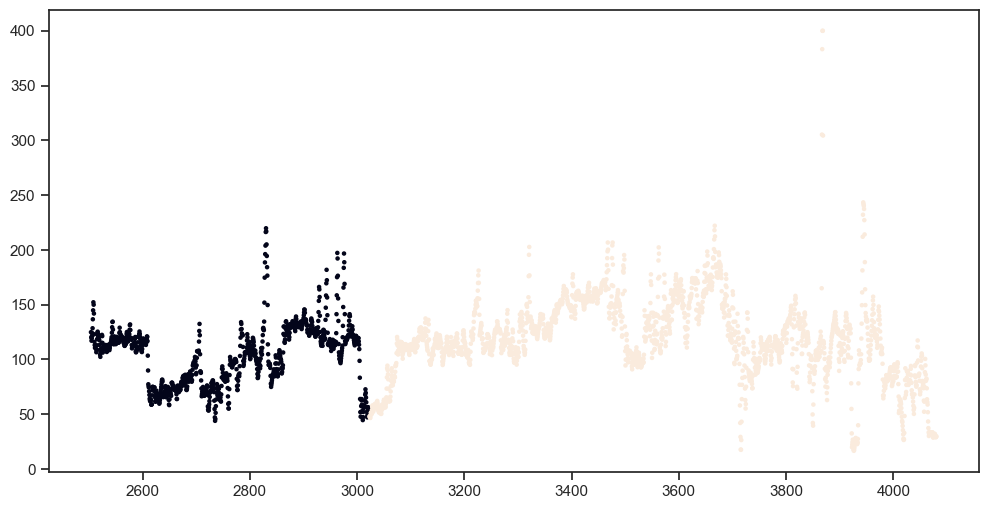

In [111]:
plt.figure(figsize=(12,6))
plt.scatter(per_well[3]['DEPT'], per_well[3]['GR'], c=per_well[3]['Zone'], s=5)

### 이상치 제거

In [112]:
features=['GR','RHOB','NPHI','log_RD','DEPT']
clf = IsolationForest(random_state=0).fit_predict(per_well2[features])
a = per_well2.copy()
per_well2 = per_well2[clf==1]

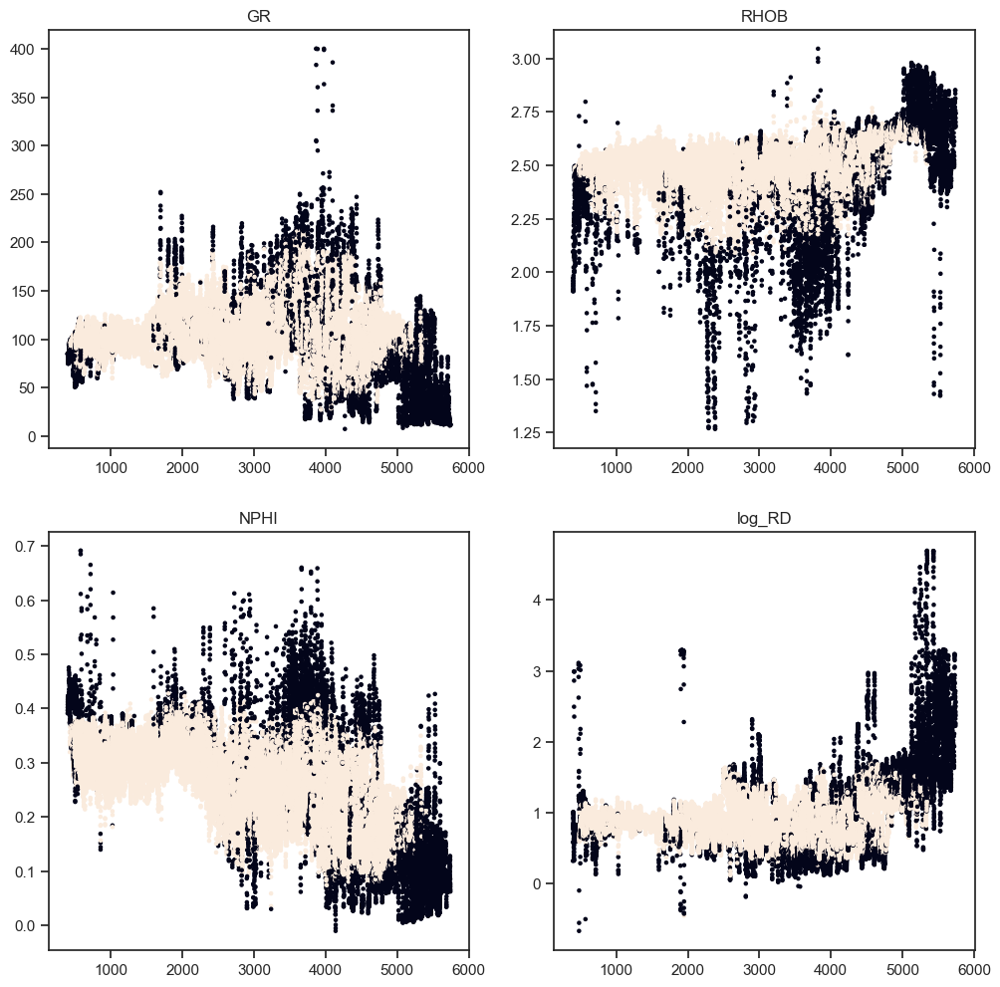

In [113]:
plt.figure(figsize=(12,12))
b = {2: 'True', 0: 'False'}
for _, i in enumerate(features[0:4]):
    plt.subplot(2, 2, _+1)
    plt.scatter(a['DEPT'], a[i], c=clf, s=5)
    plt.title('{}'.format(i))
# plt.colorbar()
# White: 이상치 Black: 정상

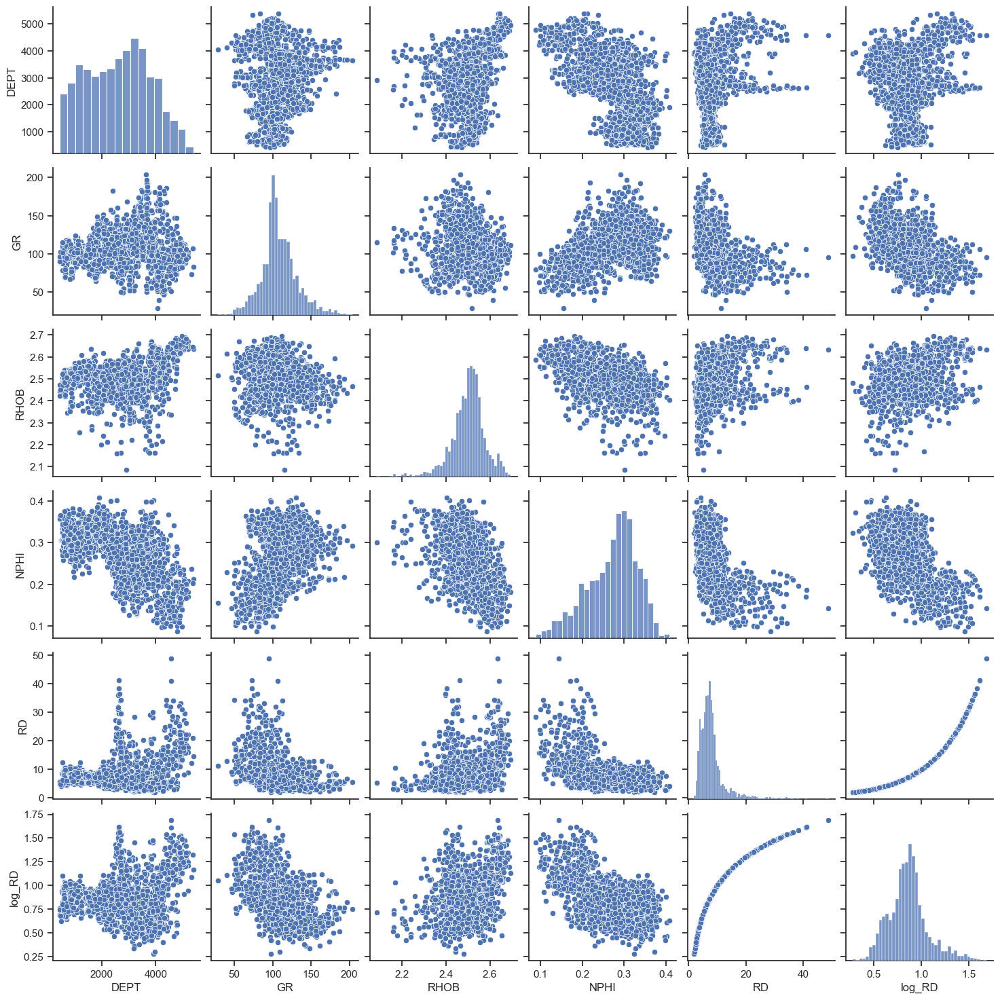

In [30]:
sns.pairplot(per_well2.sample(2000))

## DTW 분석

In [101]:
alignment = dtw.dtw(query_well, ref_well, step_pattern='asymmetric', keep_internals=True)

<Axes: xlabel='Index', ylabel='Query value'>

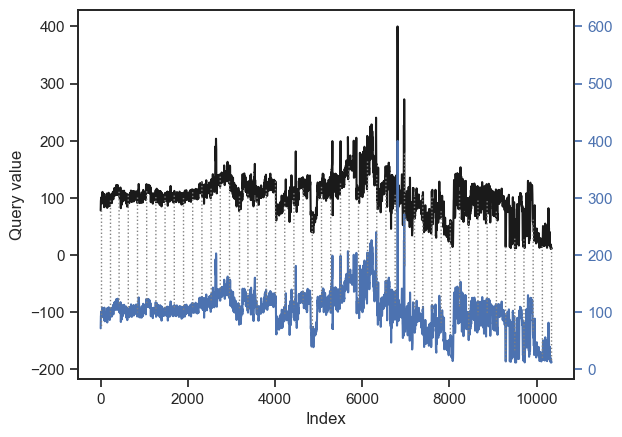

In [102]:
alignment.plot(type='twoway', offset=-200)

<Axes: xlabel='Index', ylabel='Query value'>

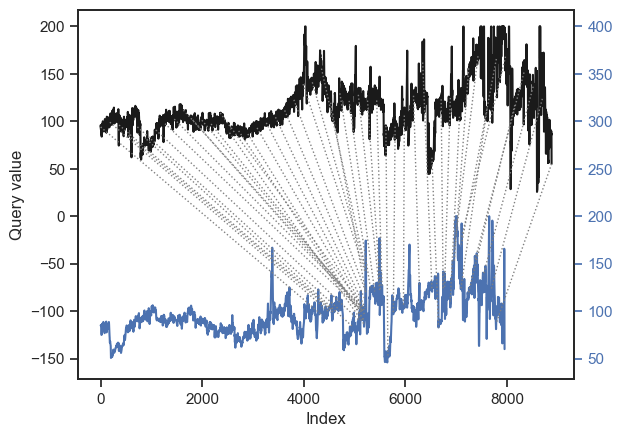

In [115]:
# index_t = {}
q, r = 0, 1
alignment = dtw.dtw(per_well[q]['GR'], per_well[r]['GR'], step_pattern='asymmetric', keep_internals=True, open_end=True, open_begin=True)
alignment.plot(type='twoway', offset=-200)
# index_t['{}_{} query'.format(q, r)]= alignment.index1
# index_t['{}_{} ref'.format(q, r)] = alignment.index2

In [40]:
index_t

{'1_0 query': array([   0,    1,    2, ..., 7952, 7953, 7954]),
 '1_0 ref': array([5575, 5575, 5575, ..., 7720, 7720, 7720], dtype=int64),
 '2_0 query': array([   0,    1,    2, ..., 7590, 7591, 7592]),
 '2_0 ref': array([ 946,  946,  946, ..., 8822, 8822, 8822], dtype=int64),
 '3_0 query': array([   0,    1,    2, ..., 3152, 3153, 3154]),
 '3_0 ref': array([5480, 5480, 5480, ..., 8880, 8880, 8880], dtype=int64),
 '0_4 query': array([   0,    1,    2, ..., 8878, 8879, 8880]),
 '0_4 ref': array([   3,    3,    3, ..., 6946, 6947, 6949], dtype=int64),
 '5_0 query': array([   0,    1,    2, ..., 3518, 3519, 3520]),
 '5_0 ref': array([5151, 5151, 5151, ..., 8614, 8614, 8614], dtype=int64),
 '0_6 query': array([   0,    1,    2, ..., 8878, 8879, 8880]),
 '0_6 ref': array([   2,    2,    2, ..., 6952, 6952, 6952], dtype=int64),
 '7_0 query': array([   0,    1,    2, ..., 7281, 7282, 7283]),
 '7_0 ref': array([3101, 3101, 3101, ..., 8793, 8793, 8793], dtype=int64),
 '0_8 query': array([   0, 

In [50]:
index_t['1_0 ref'].shape

(7955,)

In [52]:
Data.loc[index_t['1_0 ref'], 'GR']

5575     85.166
5575     85.166
5575     85.166
5575     85.166
5575     85.166
         ...   
7719    140.626
7720    111.569
7720    111.569
7720    111.569
7720    111.569
Name: GR, Length: 7955, dtype: float64

In [75]:
Data.loc[Data['Zone']==-1, 'Zone'] = 0

In [91]:
index_t['1_0 ref'].min(), index_t['1_0 ref'].max()

(5575, 7720)

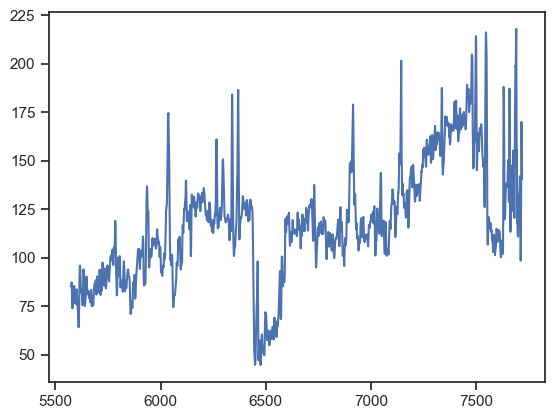

In [103]:
plt.plot(Data.iloc[5575:7720,2])

In [ ]:
for i in range(9):
    for j in range(9):
        query_well = per_well[i]['GR']
        ref_well = per_well[j]['GR']
        try:
            alignment = dtw.dtw(query_well, ref_well, step_pattern='asymmetric', keep_internals=True, open_end=True, open_begin=True)
            alignment.plot(type='twoway', offset=-200)
            # plt.savefig('DTW/open_{}_{}.png'.format(i, j))
        except ValueError:
            print('ValueError_{}_{}'.format(i,j))
            alignment = dtw.dtw(ref_well, query_well, step_pattern='asymmetric', keep_internals=True)
            alignment.plot(type='twoway', offset=-200)
            # plt.savefig('DTW/open_{}_{}.png'.format(i, j))
        

alignment_OBE = dtw(query_well, ref_well,
    step_pattern='asymmetric',
    window_type='sakoechiba', window_size=500)

<Axes: xlabel='Query index', ylabel='Reference index'>

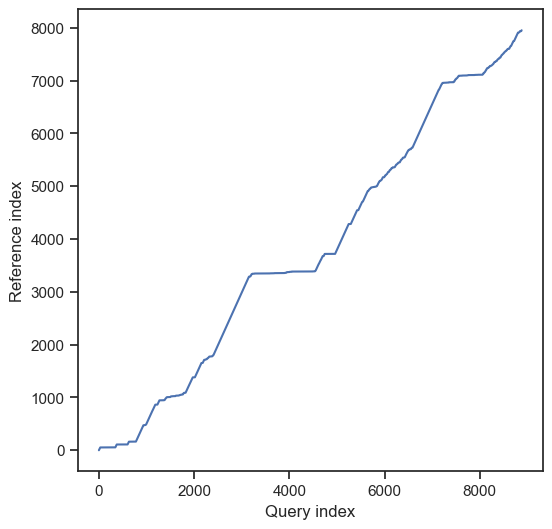

In [47]:
alignment.plot()

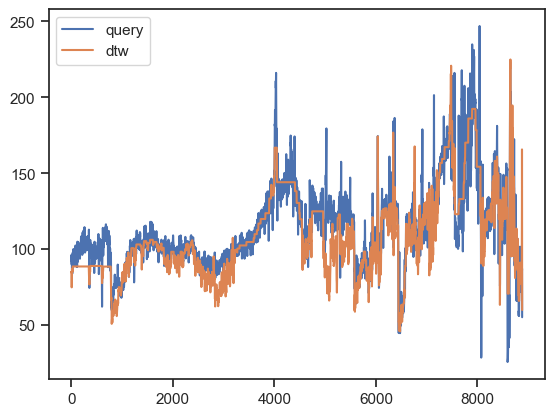

In [48]:
plt.plot(query_well, label='query')
plt.plot(alignment.index1,ref_well[alignment.index2], label='dtw')
plt.legend()

In [ ]:
## DTW 인덱스 엑셀 파일로 추출

a1 = pd.Series(alignment.index1)
a2 = pd.Series(alignment.index2)
a = pd.DataFrame(np.concatenate((alignment.index1.reshape((-1,1)), alignment.index2.reshape((-1,1))), axis=1), columns=['index1', 'index2'])
a.to_excel('dtw_index.xlsx')

### 학습 데이터 분할

In [232]:
## 학습 데이터를 Well 단위로 분할
# well_n = per_well2['well'].unique()
# np.random.shuffle(well_n)
split=0.7
n=int(np.round(len(well_n)*split))
train_well,val_well=per_well2[per_well2['well'].isin(well_n[:n])].copy(),per_well2[per_well2['well'].isin(well_n[n:])].copy()
print(well_n, n)

['01' '06' '07' '03' '04' '05' '09' '08' '02'] 6


In [41]:
## 전체 로그 데이터에서 임의로 분할
Train_data, Val_data = train_test_split(per_well[2], test_size = .2)
Feature_name = ['RHOB','NPHI','RD']

x_train, y_train = Train_data['GR'], Train_data[Feature_name]
x_val, y_val = Val_data['GR'], Val_data[Feature_name]

x_train = np.array(x_train).reshape(-1,1)
y_train = np.array(y_train).reshape(-1,3)

x_val = np.array(x_val).reshape(-1,1)
y_val = np.array(y_val).reshape(-1,3)

### 학습 데이터 전처리

#### Scaler

In [226]:
scaler1 = MinMaxScaler()
train_well['DEPT'] = scaler1.fit_transform(np.asarray(train_well['DEPT']).reshape(-1,1))
val_well['DEPT'] = scaler1.transform(np.asarray(val_well['DEPT']).reshape(-1,1))


scaler2 = MinMaxScaler()
train_well['GR'] = scaler2.fit_transform(np.asarray(train_well['GR']).reshape(-1,1))
val_well['GR'] = scaler2.transform(np.asarray(val_well['GR']).reshape(-1,1))

scaler3 = MinMaxScaler()
train_well['NPHI'] = scaler3.fit_transform(np.asarray(train_well['NPHI']).reshape(-1,1))
val_well['NPHI'] = scaler3.transform(np.asarray(val_well['NPHI']).reshape(-1,1))

scaler4 = MinMaxScaler()
train_well['RHOB'] = scaler4.fit_transform(np.asarray(train_well['RHOB']).reshape(-1,1))
val_well['RHOB'] = scaler4.transform(np.asarray(val_well['RHOB']).reshape(-1,1))

scaler5 = MinMaxScaler()
train_well['log_RD'] = scaler5.fit_transform(np.asarray(train_well['log_RD']).reshape(-1,1))
val_well['log_RD'] = scaler5.transform(np.asarray(val_well['log_RD']).reshape(-1,1))

### 모델 선정 및 학습

In [34]:
rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
xg_reg = xgboost.XGBRFRegressor()

In [217]:
y_train_pred = train_well[['DEPT', 'GR', 'Zone']].copy()
y_val_pred = val_well[['DEPT', 'GR', 'Zone']].copy()

In [233]:
## Zonation 안했을 경우 RF 3
y_train_pred = train_well[['DEPT', 'GR']].copy()
y_val_pred = val_well[['DEPT', 'GR']].copy()

x_feat1 = ['DEPT', 'GR']
y_feat1 = ['NPHI',]

rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat1], train_well[y_feat1])

y_train_pred['NPHI'] = rf_reg.predict(train_well[x_feat1])
y_val_pred['NPHI'] = rf_reg.predict(val_well[x_feat1])
for _, feat in enumerate(y_feat1):
    train_well['{}_pred'.format(feat)] = y_train_pred[feat]
    val_well['{}_pred'.format(feat)] = y_val_pred[feat]


x_feat2 = ['DEPT', 'GR', 'NPHI']
y_feat2 = ['RHOB']


rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat2], train_well[y_feat2])

y_train_pred['RHOB'] = rf_reg.predict(y_train_pred[x_feat2])
y_val_pred['RHOB'] = rf_reg.predict(y_val_pred[x_feat2])
for _, feat in enumerate(y_feat2):
    train_well['{}_pred'.format(feat)] = y_train_pred[feat]
    val_well['{}_pred'.format(feat)] = y_val_pred[feat]

x_feat3 = ['DEPT', 'GR', 'NPHI', 'RHOB']
y_feat3 = ['log_RD']


rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat3], train_well[y_feat3])

y_train_pred['log_RD'] = rf_reg.predict(y_train_pred[x_feat3])
y_val_pred['log_RD'] = rf_reg.predict(y_val_pred[x_feat3])
for _, feat in enumerate(y_feat3):
    train_well['{}_pred'.format(feat)] = y_train_pred[feat]
    val_well['{}_pred'.format(feat)] = y_val_pred[feat]

C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\475456701.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat1], train_well[y_feat1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\475456701.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat2], train_well[y_feat2])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\475456701.py:36: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat3], train_well[y_feat3])


In [148]:
## Zonation 안했을 경우
x_feat1 = ['DEPT', 'GR']
y_feat1 = ['NPHI',]

rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat1], train_well[y_feat1])

y_train_pred['NPHI'] = rf_reg.predict(train_well[x_feat1])
y_val_pred['NPHI'] = rf_reg.predict(val_well[x_feat1])


for _, feat in enumerate(y_feat1):
    train_well['{}_pred'.format(feat)] = y_train_pred['NPHI']
    val_well['{}_pred'.format(feat)] = y_val_pred['NPHI']



x_feat2 = ['DEPT', 'GR', 'NPHI']
y_feat2 = ['RHOB']


rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat2], train_well[y_feat2])

y_train_pred['RHOB'] = rf_reg.predict(y_train_pred[x_feat2])
y_val_pred['RHOB'] = rf_reg.predict(y_val_pred[x_feat2])
for _, feat in enumerate(y_feat2):
    train_well['{}_pred'.format(feat)] = y_train_pred['RHOB']
    val_well['{}_pred'.format(feat)] = y_val_pred['RHOB']

x_feat3 = ['DEPT', 'GR', 'NPHI', 'RHOB']
y_feat3 = ['log_RD']


rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(train_well[x_feat3], train_well[y_feat3])

y_train_pred['log_RD'] = rf_reg.predict(y_train_pred[x_feat3])
y_val_pred['log_RD'] = rf_reg.predict(y_val_pred[x_feat3])
for _, feat in enumerate(y_feat3):
    train_well['{}_pred'.format(feat)] = y_train_pred['log_RD']
    val_well['{}_pred'.format(feat)] = y_val_pred['log_RD']

C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\727491096.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat1], train_well[y_feat1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\727491096.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat2], train_well[y_feat2])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\727491096.py:36: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well[x_feat3], train_well[y_feat3])


In [141]:
r2_zone_train = np.zeros((3, len(train_well['Zone'].unique())))
r2_zone_val = np.zeros((3, len(val_well['Zone'].unique())))

In [156]:
for i in range(3):
    for j, feat in enumerate(['NPHI', 'RHOB', 'log_RD']):
        r2_zone_train[j, i] = r2_score(train_well.loc[train_well['Zone']==i, feat], y_train_pred.loc[y_train_pred['Zone']==i,feat])
        r2_zone_val[j, i] = r2_score(val_well.loc[val_well['Zone']==i, feat], y_val_pred.loc[y_val_pred['Zone']==i,feat])

In [123]:
# Zonation한 경우 RF 3
x_feat1 = ['DEPT', 'GR']
y_feat1 = ['NPHI']

x_feat2 = ['DEPT', 'GR', 'NPHI']
y_feat2 = ['RHOB']

x_feat3 = ['DEPT', 'GR', 'NPHI', 'RHOB']
y_feat3 = ['log_RD']


r2_zone_train = np.zeros((3, len(train_well['Zone'].unique())))
r2_zone_val = np.zeros((3, len(val_well['Zone'].unique())))


for i in per_well2['Zone'].unique():
    rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
    rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat1], train_well.loc[train_well['Zone']==i, y_feat1])
    y_train_pred.loc[y_train_pred['Zone']==i,'NPHI'] = rf_reg.predict(train_well.loc[train_well['Zone']==i, x_feat1])
    y_val_pred.loc[y_val_pred['Zone']==i,'NPHI'] = rf_reg.predict(val_well.loc[val_well['Zone']==i, x_feat1])

    r2_zone_train[0, i] = r2_score(train_well.loc[train_well['Zone']==i, 'NPHI'], y_train_pred.loc[y_train_pred['Zone']==i,'NPHI'])
    r2_zone_val[0, i] = r2_score(val_well.loc[val_well['Zone']==i, 'NPHI'], y_val_pred.loc[y_val_pred['Zone']==i,'NPHI'])
    
    for _, j in enumerate(y_feat1):
        train_well.loc[train_well['Zone']==i, '{}_pred'.format(j)] = y_train_pred.loc[y_train_pred['Zone']==i,j]
        val_well.loc[val_well['Zone']==i, '{}_pred'.format(j)] =  y_val_pred.loc[y_val_pred['Zone']==i, j]
    
    rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
    rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat2], train_well.loc[train_well['Zone']==i, y_feat2])
    y_train_pred.loc[y_train_pred['Zone']==i,'RHOB'] = rf_reg.predict(y_train_pred.loc[y_train_pred['Zone']==i, x_feat2])
    y_val_pred.loc[y_val_pred['Zone']==i,'RHOB'] = rf_reg.predict(y_val_pred.loc[y_val_pred['Zone']==i, x_feat2])

    r2_zone_train[1, i] = r2_score(train_well.loc[train_well['Zone']==i, 'RHOB'], y_train_pred.loc[y_train_pred['Zone']==i,'RHOB'])
    r2_zone_val[1, i] = r2_score(val_well.loc[val_well['Zone']==i, 'RHOB'], y_val_pred.loc[y_val_pred['Zone']==i,'RHOB'])

    for _, j in enumerate(y_feat2):
        train_well.loc[train_well['Zone']==i, '{}_pred'.format(j)] = y_train_pred.loc[y_train_pred['Zone']==i,j]
        val_well.loc[val_well['Zone']==i, '{}_pred'.format(j)] = y_val_pred.loc[y_val_pred['Zone']==i, j] 
    
    rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
    rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat3], train_well.loc[train_well['Zone']==i, y_feat3])
    y_train_pred.loc[y_train_pred['Zone']==i,'log_RD'] = rf_reg.predict(y_train_pred.loc[y_train_pred['Zone']==i, x_feat3])
    y_val_pred.loc[y_val_pred['Zone']==i,'log_RD'] = rf_reg.predict(y_val_pred.loc[y_val_pred['Zone']==i, x_feat3])

    r2_zone_train[2, i] = r2_score(train_well.loc[train_well['Zone']==i, 'log_RD'], y_train_pred.loc[y_train_pred['Zone']==i,'log_RD'])
    r2_zone_val[2, i] = r2_score(val_well.loc[val_well['Zone']==i, 'log_RD'], y_val_pred.loc[y_val_pred['Zone']==i,'log_RD'])

    for _, j in enumerate(y_feat3):
        train_well.loc[train_well['Zone']==i, '{}_pred'.format(j)] = y_train_pred.loc[y_train_pred['Zone']==i,j]
        val_well.loc[val_well['Zone']==i, '{}_pred'.format(j)] = y_val_pred.loc[y_val_pred['Zone']==i, j]

C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\453449061.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat1], train_well.loc[train_well['Zone']==i, y_feat1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\453449061.py:30: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat2], train_well.loc[train_well['Zone']==i, y_feat2])
C:\Users\DELL\AppData\Local\Temp\ipykernel_26320\453449061.py:42: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat3], train_well.loc[train_well['Zone']==i, y_feat3])
C:\Users\D

In [ ]:
## Zonation 한 경우
x_feat = ['DEPT', 'GR']
y_feat = ['RHOB', 'NPHI', 'log_RD']

for i in per_well2['Zone'].unique():
    rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
    rf_reg.fit(train_well.loc[train_well['Zone']==i, x_feat], train_well.loc[train_well['Zone']==i, y_feat])
    y_train_pred = rf_reg.predict(train_well.loc[train_well['Zone']==i, x_feat])
    y_val_pred = rf_reg.predict(val_well.loc[val_well['Zone']==i, x_feat])
    for _, j in enumerate(y_feat):
        train_well.loc[train_well['Zone']==i, '{}_pred'.format(j)] = y_train_pred[:,_]
        val_well.loc[val_well['Zone']==i, '{}_pred'.format(j)] = y_val_pred[:,_]

In [19]:
xg_reg.fit(x_train, y_train)

XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=100, n_jobs=None, num_parallel_tree=None,
               objective='reg:squarederror', predictor=None, random_state=None,
               reg_alpha=None, ...)

In [26]:
# lightGBM, SVR 학습
y_train_pred_light = np.zeros((len(x_train), 3))
y_val_pred_light = np.zeros((len(x_val), 3))
y_train_pred_svm = np.zeros((len(x_train), 3))
y_val_pred_svm = np.zeros((len(x_val), 3))
r2_light = []
r2_light_val = []
r2_svm = []
r2_svm_val = []

for i in range(3):
    d_train = lightgbm.Dataset(x_train, label=y_train[:,i])
    params = {}
    params['learning_rate'] = 0.003
    params['boosting_type'] = 'gbdt'
    # params['objective'] = 'binary'
    params['metric'] = 'MSE'
    # params['sub_feature'] = 0.5
    # params['num_leaves'] = 10
    # params['min_data'] = 50
    # params['max_depth'] = 10
    light_reg = lightgbm.train(params, d_train, 100)

    light_pred = light_reg.predict(x_train)
    y_train_pred_light[:,i] = light_pred

    light_pred2 = light_reg.predict(x_val)
    y_val_pred_light[:,i] = light_pred2

    r2_light.append(r2_score(y_train[:,i], light_pred))
    r2_light_val.append(r2_score(y_val[:,i], light_pred2))

    svm_reg = SVR()
    svm_reg.fit(x_train, y_train[:,i])
    svm_pred = svm_reg.predict(x_train)
    svm_pred2 = svm_reg.predict(x_val)
    y_train_pred_svm[:,i] = svm_pred
    y_val_pred_svm[:,i] = svm_pred2
    r2_svm.append(r2_score(y_train[:,i], svm_pred))
    r2_svm_val.append(r2_score(y_val[:,i], svm_pred2))

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 55443, number of used features: 1
[LightGBM] [Info] Start training from score 2.490061
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 55443, number of used features: 1
[LightGBM] [Info] Start training from score 0.267299
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train

In [166]:
d_train = lightgbm.Dataset(x_train, label=y_train[:,0])
params = {}
params['learning_rate'] = 0.003
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'binary_logloss'
params['sub_feature'] = 0.5
params['num_leaves'] = 10
params['min_data'] = 50
params['max_depth'] = 10
model = lightgbm.train(params, d_train, 100)


[LightGBM] [Warning] Contains only one class
[LightGBM] [Info] Number of positive: 55443, number of negative: 0
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 55443, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=1.000000 -> initscore=34.539576
[LightGBM] [Info] Start training from score 34.539576
[LightGBM] [Info] [binary:BoostFromScore]: pavg=1.000000 -> initscore=34.539576
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

In [167]:
svm_reg.fit(x_train, y_train[:,0])

SVR()

In [27]:
r2_rf = []
r2_rf_val = []
r2_xg = []
r2_xg_val = []

y_train_pred_rf = rf_reg.predict(x_train)
y_val_pred_rf = rf_reg.predict(x_val)
y_train_pred_xg = xg_reg.predict(x_train)
y_val_pred_xg = xg_reg.predict(x_val)


for i in range(3):
    r2_rf.append(r2_score(y_train[:, i], y_train_pred_rf[:, i]))
    r2_rf_val.append(r2_score(y_val[:, i], y_val_pred_rf[:, i]))
    r2_xg.append(r2_score(y_train[:, i], y_train_pred_xg[:, i]))
    r2_xg_val.append(r2_score(y_val[:, i], y_val_pred_xg[:, i]))

In [182]:
y_train_pred_svm = svm_reg.predict(x_train)

In [184]:
y_train_pred_light = model.predict(x_train)

### 학습 결과 플랏

In [228]:
## 스케일된 값 복원

train_well['DEPT'] = scaler1.inverse_transform(np.asarray(train_well['DEPT']).reshape(-1,1))
val_well['DEPT'] = scaler1.inverse_transform(np.asarray(val_well['DEPT']).reshape(-1,1))

train_well['GR'] = scaler2.inverse_transform(np.asarray(train_well['GR']).reshape(-1,1))
val_well['GR'] = scaler2.inverse_transform(np.asarray(val_well['GR']).reshape(-1,1))

train_well['NPHI'] = scaler3.inverse_transform(np.asarray(train_well['NPHI']).reshape(-1,1))
val_well['NPHI'] = scaler3.inverse_transform(np.asarray(val_well['NPHI']).reshape(-1,1))
val_well['NPHI_pred'] = scaler3.inverse_transform(np.asarray(val_well['NPHI_pred']).reshape(-1,1))

train_well['RHOB'] = scaler4.inverse_transform(np.asarray(train_well['RHOB']).reshape(-1,1))
val_well['RHOB'] = scaler4.inverse_transform(np.asarray(val_well['RHOB']).reshape(-1,1))
val_well['RHOB_pred'] = scaler4.inverse_transform(np.asarray(val_well['RHOB_pred']).reshape(-1,1))

train_well['log_RD'] = scaler5.inverse_transform(np.asarray(train_well['log_RD']).reshape(-1,1))
val_well['log_RD'] = scaler5.inverse_transform(np.asarray(val_well['log_RD']).reshape(-1,1))
val_well['log_RD_pred'] = scaler5.inverse_transform(np.asarray(val_well['log_RD_pred']).reshape(-1,1))


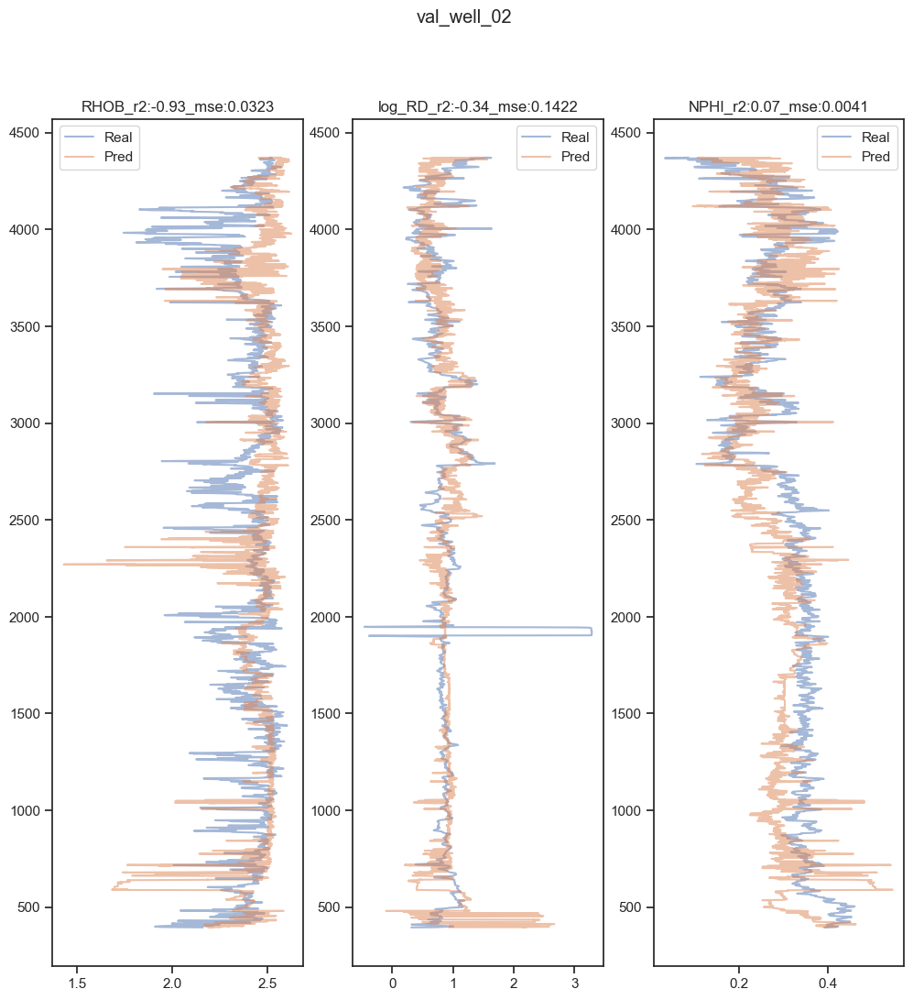

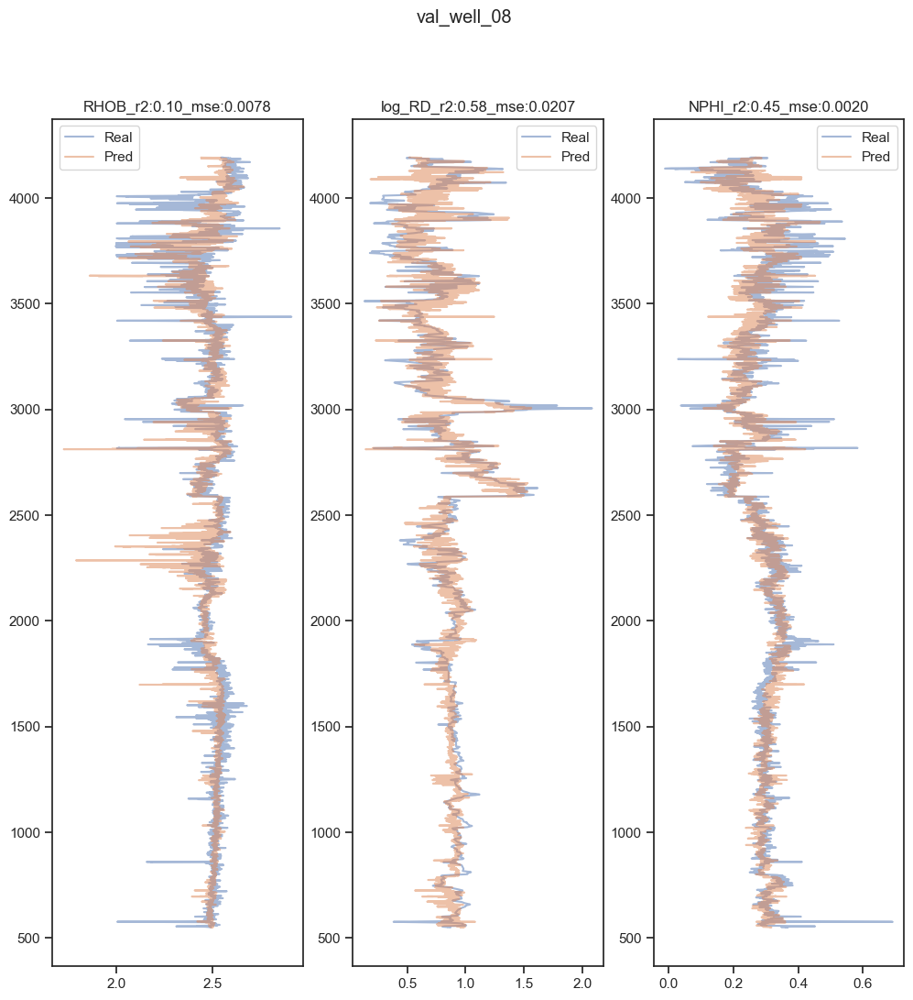

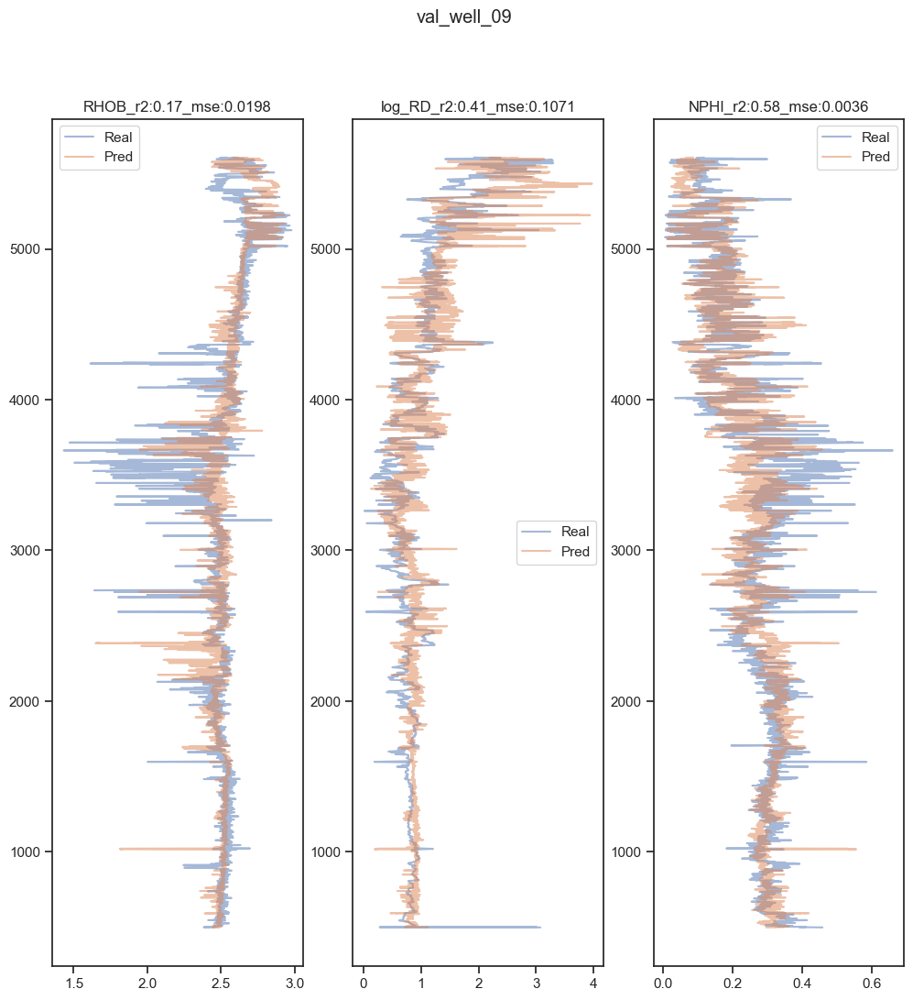

In [235]:
## Validation well plot

val_well_n = val_well['well'].unique()
y_feat = ['RHOB', 'log_RD', 'NPHI']
x_feat = ['DEPT', 'GR']


for _, i in enumerate(val_well_n):
    # plt.figure(figsize=(12,12))
    fig, axs = plt.subplots(1,3, figsize=(12,12))
    fig.suptitle('val_well_{}'.format(i))
    for j, feat in enumerate(y_feat):
        r2 = r2_score(val_well.loc[val_well['well']==i, feat], val_well.loc[val_well['well']==i, '{}_pred'.format(feat)])
        mse = mean_squared_error(val_well.loc[val_well['well']==i, feat], val_well.loc[val_well['well']==i, '{}_pred'.format(feat)])
        axs[j].plot(val_well.loc[val_well['well']==i, feat], val_well.loc[val_well['well']==i, 'DEPT'], label = 'Real', alpha=0.5)
        axs[j].plot(val_well.loc[val_well['well']==i, '{}_pred'.format(feat)], val_well.loc[val_well['well']==i, 'DEPT'], label = 'Pred', alpha=0.5)
        axs[j].legend()
        axs[j].title.set_text('{}_r2:{:.2f}_mse:{:.4f}'.format(feat,r2,mse))
    # fig.savefig('Val/2/val_{}_ZonationX_scaledX.png'.format(i))

In [125]:
r2_zone_train, r2_zone_val

(array([[0.95430559, 0.96959203, 0.96629249],
        [0.85984369, 0.81242163, 0.87360903],
        [0.85004232, 0.89129071, 0.90660916]]),
 array([[-0.42683117,  0.32534442,  0.37542113],
        [-0.26937802, -0.58025781,  0.26426343],
        [-0.13918691, -0.11716868,  0.28891102]]))

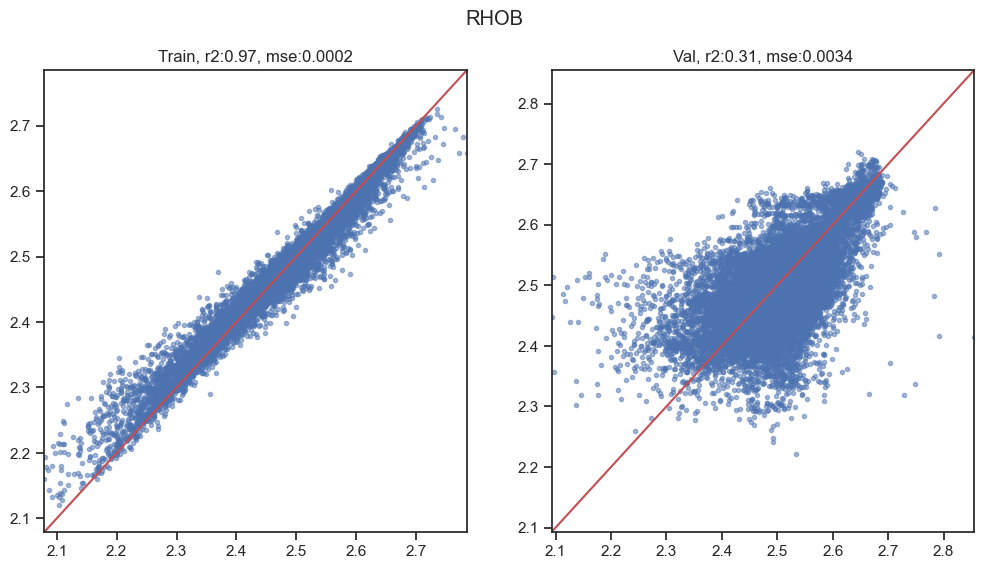

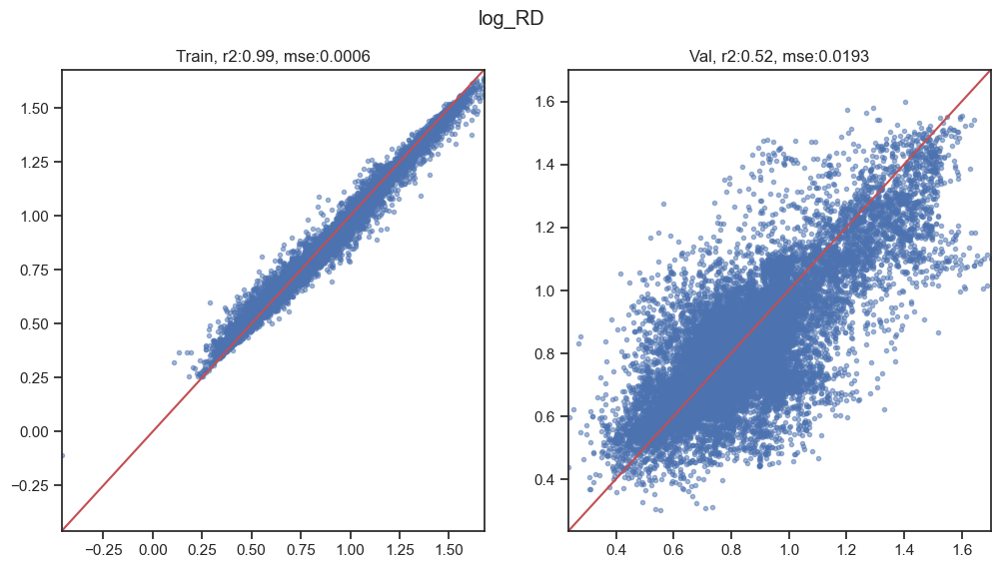

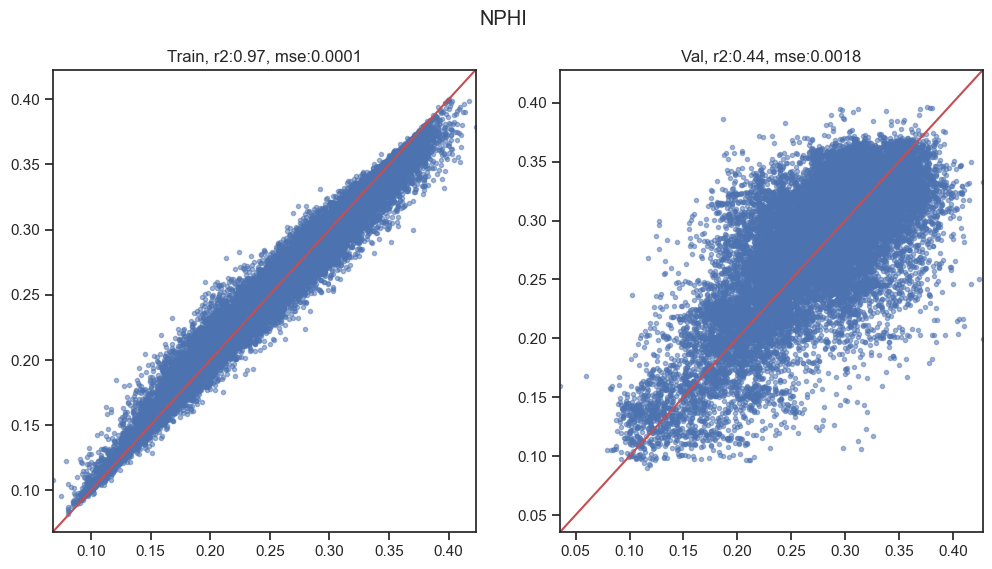

In [132]:
y_feat = ['RHOB', 'log_RD', 'NPHI']
for i, feat in enumerate(y_feat):
    x_min, x_max = train_well[feat].min(), train_well[feat].max()
    solid_line = [x_min, x_max]

    x_min2, x_max2 = val_well[feat].min(), val_well[feat].max()
    solid_line2 = [x_min2, x_max2]
    r2_train = r2_score(train_well[feat], train_well['{}_pred'.format(feat)])
    r2_val = r2_score(val_well[feat], val_well['{}_pred'.format(feat)])
    mse_train = mean_squared_error(train_well[feat], train_well['{}_pred'.format(feat)])
    mse_val = mean_squared_error(val_well[feat], val_well['{}_pred'.format(feat)])


    plt.figure(figsize=(12,6))

    plt.suptitle('{}'.format(feat))
    
    plt.subplot(121)
    plt.plot(train_well[feat], train_well['{}_pred'.format(feat)], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Train, r2:{:.2f}, mse:{:.4f}'.format(r2_train, mse_train))

    plt.subplot(122)
    plt.plot(val_well[feat], val_well['{}_pred'.format(feat)], '.', alpha=0.5)
    plt.plot(solid_line2, solid_line2, c='r')
    plt.xlim(x_min2, x_max2)
    plt.ylim(x_min2, x_max2)
    plt.title('Val, r2:{:.2f}, mse:{:.4f}'.format(r2_val, mse_val))

    plt.savefig('Val/2/{}_ZoneationX_1.png'.format(feat))

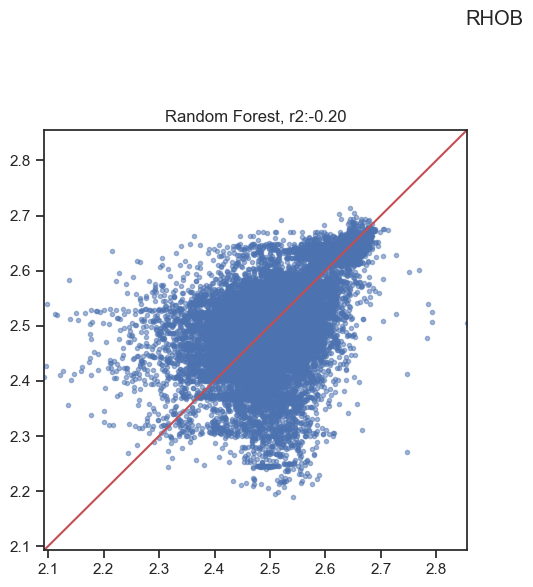

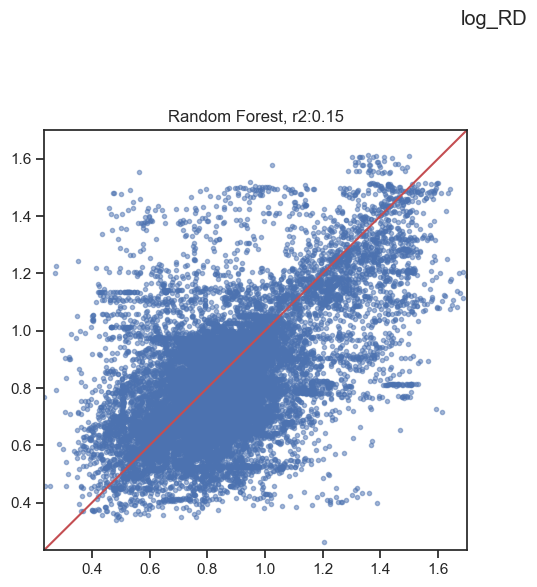

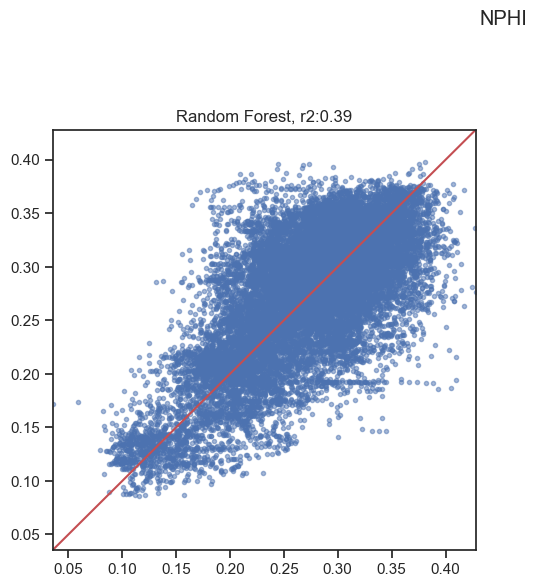

In [228]:
y_feat = ['RHOB', 'log_RD', 'NPHI']
for i, feat in enumerate(y_feat):
    x_min, x_max = val_well[feat].min(), val_well[feat].max()
    solid_line = [x_min, x_max]
    r2 = r2_score(val_well[feat], val_well['{}_pred'.format(feat)])

    plt.figure(figsize=(12,12))

    plt.suptitle('{}'.format(feat))

    plt.subplot(221)
    plt.plot(val_well[feat], val_well['{}_pred'.format(feat)], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2))

    # plt.subplot(222)
    # plt.plot(val_well[feat], y_train_pred_xg[:,i], '.', alpha=0.5)
    # plt.plot(solid_line, solid_line, c='r')
    # plt.xlim(x_min, x_max)
    # plt.ylim(x_min, x_max)
    # plt.title('XGBoost, r2:{:.2f}'.format(r2_xg[i]))

    # plt.subplot(223)
    # plt.plot(val_well[feat], y_train_pred_svm[:, i], '.', alpha=0.5)
    # plt.plot(solid_line, solid_line, c='r')
    # plt.xlim(x_min, x_max)
    # plt.ylim(x_min, x_max)
    # plt.title('SVR, r2:{:.2f}'.format(r2_svm[i]))

    # plt.subplot(224)
    # plt.plot(val_well[feati], y_train_pred_light[:, i], '.', alpha=0.5)
    # plt.plot(solid_line, solid_line, c='r')
    # plt.xlim(x_min, x_max)
    # plt.ylim(x_min, x_max)
    # plt.title('Light GBM, r2:{:.2f}'.format(r2_light[i]))

In [29]:
r2_rf_val, r2_rf

([-0.3243837660743054, 0.01803639067467444, 0.2773859379766408],
 [0.7898684755703305, 0.837738051827547, 0.8853131329024121])

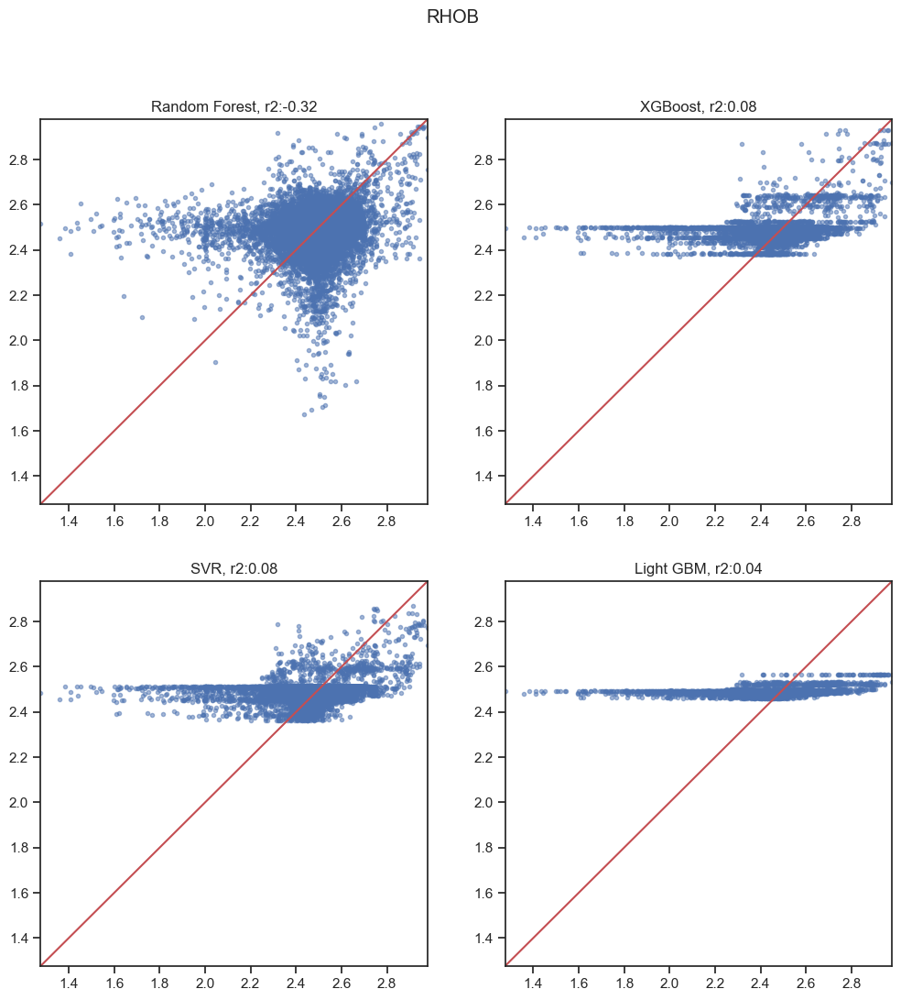

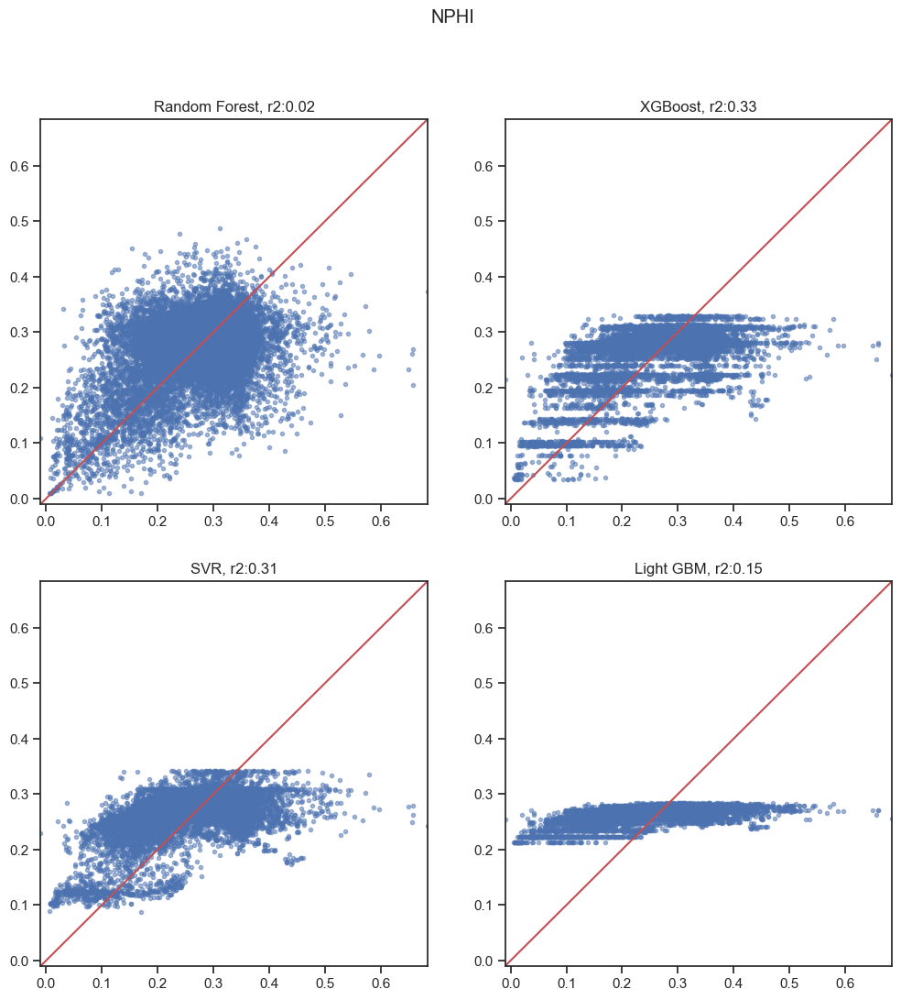

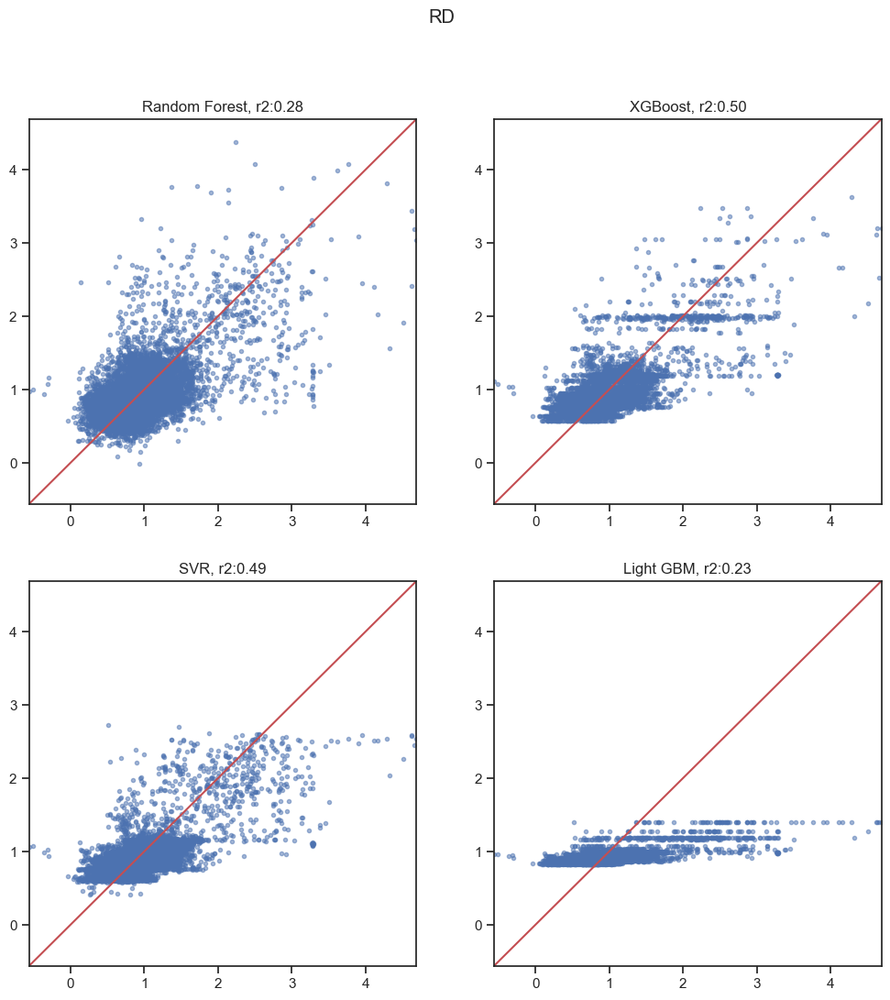

In [30]:
for i in range(3):
    x_min, x_max = y_val[:,i].min(), y_val[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(12,12))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(221)
    plt.plot(y_val[:,i], y_val_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf_val[i]))

    plt.subplot(222)
    plt.plot(y_val[:,i], y_val_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg_val[i]))

    plt.subplot(223)
    plt.plot(y_val[:,i], y_val_pred_svm[:, i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('SVR, r2:{:.2f}'.format(r2_svm_val[i]))

    plt.subplot(224)
    plt.plot(y_val[:, i], y_val_pred_light[:, i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Light GBM, r2:{:.2f}'.format(r2_light_val[i]))

### 파이프라인 구축

In [ ]:
# 파이프라인 구축
rf_reg = RandomForestRegressor()
xg_reg = xgboost.XGBRFRegressor()
light_reg = lightgbm.LGBMRegressor()
svm_reg = SVR()

pipeline = Pipeline([
    ('rf_reg', rf_reg),
    ('xg_reg', xg_reg),
    ('light_reg', light_reg),
    ('svm_reg', svm_reg)
])

### 실험실

In [199]:
# Median filter
window_size = 200
window = []
for i in range(len(per_well[0]['GR'])):
    if i < window_size//2 :
        window.append(np.median(per_well[0]['GR'][:i]))
    elif i > len(per_well[0]) - window_size//2 :
        window.append(np.median(per_well[0]['GR'][i-window_size//2:-1]))
    else:
        window.append(np.median(per_well[0]['GR'][i-window_size//2:i+window_size//2]))

c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\DELL\anaconda3\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


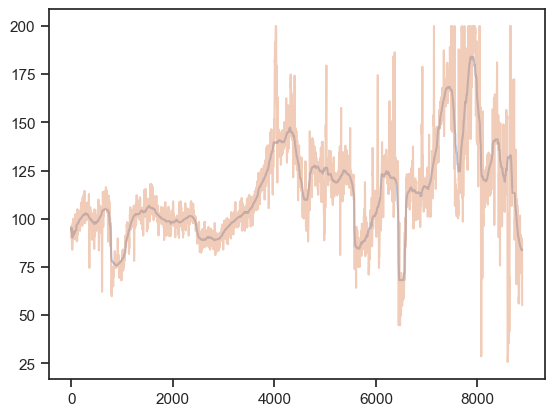

In [200]:
plt.plot(window, alpha=0.4)
plt.plot(per_well[0]['GR'], alpha=0.4)

In [41]:
# Zone 구분 할 때, 학습 결과
Data = pd.read_excel('Median.xlsx')
Data['RD'] = np.log10(Data['RD'])

In [20]:
Data_n = Data.loc[Data['Zone']==-1]
Data_0 = Data.loc[Data['Zone']==0]
Data_p = Data.loc[Data['Zone']==1]

In [21]:
train_x_n, val_x_n = train_test_split(Data_n, test_size=0.2)
train_x_0, val_x_0 = train_test_split(Data_0, test_size=0.2)
train_x_p, val_x_p = train_test_split(Data_p, test_size=0.2)

In [22]:
Feature_name = ['RHOB','NPHI','RD']
train_x_n, train_y_n = train_x_n['GR'], train_x_n[Feature_name]
val_x_n, val_y_n = val_x_n['GR'], val_x_n[Feature_name]

train_x_0, train_y_0 = train_x_0['GR'], train_x_0[Feature_name]
val_x_0, val_y_0 = val_x_0['GR'], val_x_0[Feature_name]

train_x_p, train_y_p = train_x_p['GR'], train_x_p[Feature_name]
val_x_p, val_y_p = val_x_p['GR'], val_x_p[Feature_name]

In [33]:
train_x_n = np.array(train_x_n).reshape(-1,1)
train_y_n = np.array(train_y_n).reshape(-1,3)

train_x_0 = np.array(train_x_0).reshape(-1,1)
train_y_0 = np.array(train_y_0).reshape(-1,3)

train_x_p = np.array(train_x_p).reshape(-1,1)
train_y_p = np.array(train_y_p).reshape(-1,3)

val_x_n = np.array(val_x_n).reshape(-1,1)
val_y_n = np.array(val_y_n).reshape(-1,3)

val_x_0 = np.array(val_x_0).reshape(-1,1)
val_y_0 = np.array(val_y_0).reshape(-1,3)

val_x_p = np.array(val_x_p).reshape(-1,1)
val_y_p = np.array(val_y_p).reshape(-1,3)

In [37]:
train_y = np.zeros((1,3))

for i in [train_y_n, train_y_0, train_y_p]:
    train_y = np.concatenate((train_y, i), axis=0)
train_y = np.delete(train_y, 0, axis=0)

val_y = np.zeros((1,3))

for i in [val_y_n, val_y_0, val_y_p]:
    val_y = np.concatenate((val_y, i), axis=0)
val_y = np.delete(val_y, 0, axis=0)

In [53]:
rf_reg2 = RandomForestRegressor()
xg_reg2 = xgboost.XGBRegressor()
lin_reg = LinearRegression()

train_y_pred_rf = np.zeros((1, 3))
train_y_pred_xg = np.zeros((1, 3))
train_y_pred_lin = np.zeros((1, 3))
val_y_pred_rf = np.zeros((1, 3))
val_y_pred_xg = np.zeros((1, 3))
val_y_pred_lin = np.zeros((1, 3))
for i, j, k in [[train_x_n,train_y_n, val_x_n],[train_x_0,train_y_0, val_x_0],[train_x_p,train_y_p, val_x_p]]:
    rf_reg2.fit(i, j)
    xg_reg2.fit(i, j)
    lin_reg.fit(i, j)

    train_y_pred_rf = np.concatenate((train_y_pred_rf, rf_reg2.predict(i)), axis=0)
    train_y_pred_xg = np.concatenate((train_y_pred_xg, xg_reg2.predict(i)), axis=0)
    train_y_pred_lin = np.concatenate((train_y_pred_lin, lin_reg.predict(i)), axis=0)
    val_y_pred_rf = np.concatenate((val_y_pred_rf, rf_reg2.predict(k)), axis=0)
    val_y_pred_xg = np.concatenate((val_y_pred_xg, xg_reg2.predict(k)), axis=0)
    val_y_pred_lin = np.concatenate((val_y_pred_lin, lin_reg.predict(k)), axis=0)
train_y_pred_rf = np.delete(train_y_pred_rf, 0, axis=0)
train_y_pred_xg = np.delete(train_y_pred_xg, 0, axis=0)
train_y_pred_lin = np.delete(train_y_pred_lin, 0, axis=0)
val_y_pred_rf = np.delete(val_y_pred_rf, 0, axis=0)
val_y_pred_xg = np.delete(val_y_pred_xg, 0, axis=0)
val_y_pred_lin = np.delete(val_y_pred_lin, 0, axis=0)

In [54]:
r2_rf2 = []
r2_xg2 = []
for i in range(3):
    r2_rf2.append(r2_score(train_y[:, i], train_y_pred_rf[:, i]))
    r2_xg2.append(r2_score(train_y[:, i], train_y_pred_xg[:, i]))

r2_rf3 = []
r2_xg3 = []
for i in range(3):
    r2_rf3.append(r2_score(val_y[:, i], val_y_pred_rf[:, i]))
    r2_xg3.append(r2_score(val_y[:, i], val_y_pred_xg[:, i]))

r2_lin = []
r2_lin2 = []
for i in range(3):
    r2_lin.append(r2_score(train_y[:, i], train_y_pred_lin[:, i]))
    r2_lin2.append(r2_score(val_y[:, i], val_y_pred_lin[:, i]))

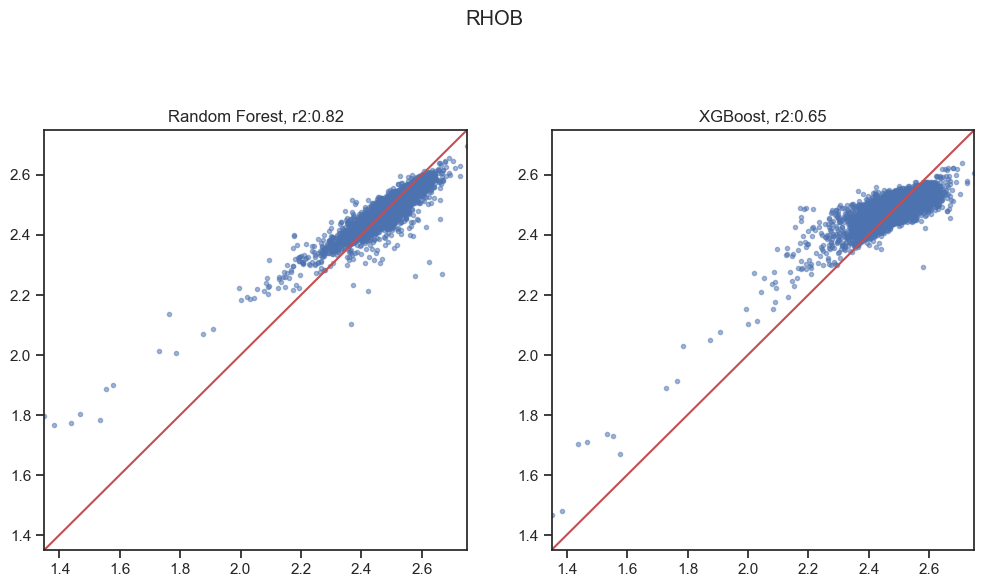

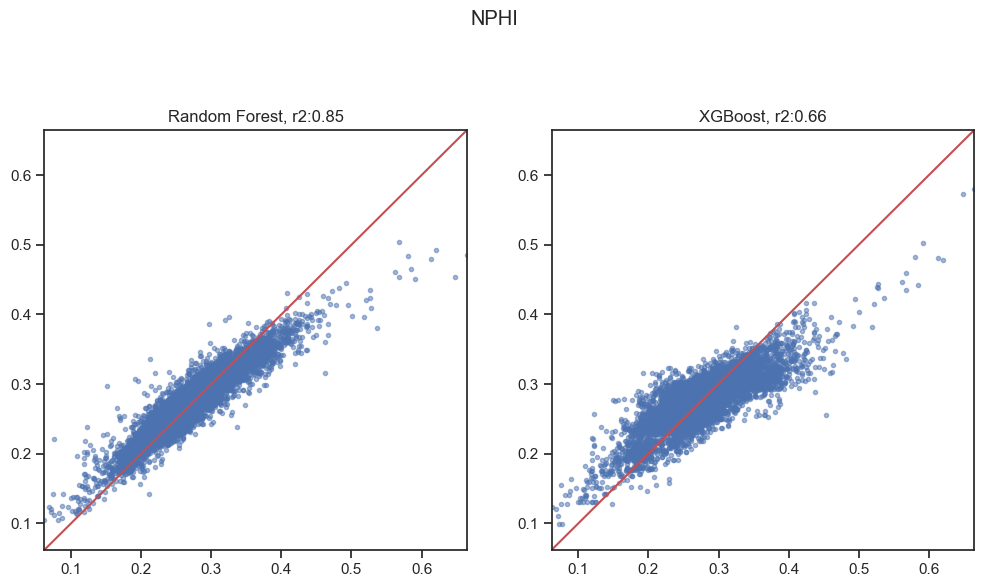

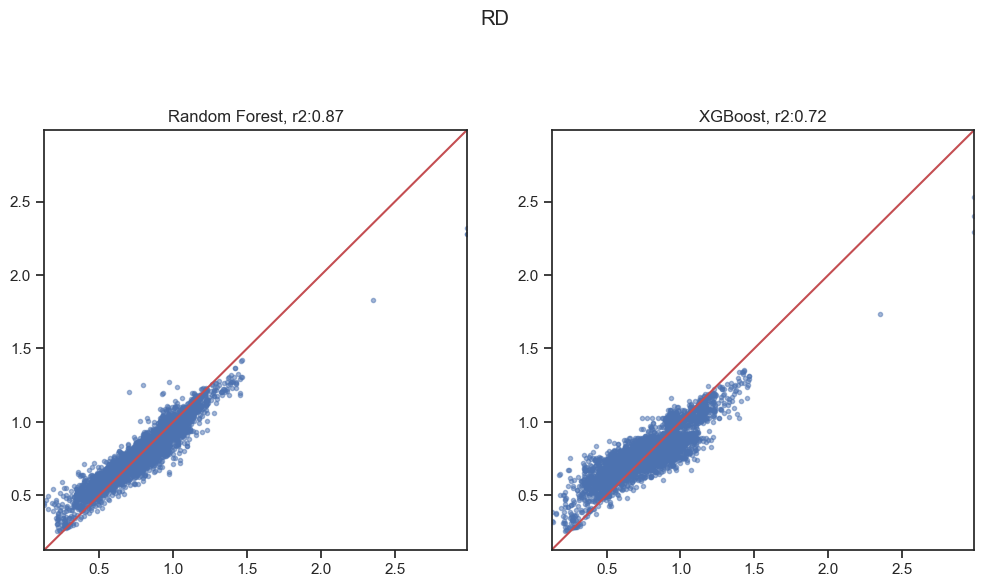

In [39]:
for i in range(3):
    x_min, x_max = train_y[:,i].min(), train_y[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(12,12))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(221)
    plt.plot(train_y[:,i], train_y_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf2[i]))

    plt.subplot(222)
    plt.plot(train_y[:,i], train_y_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg2[i]))

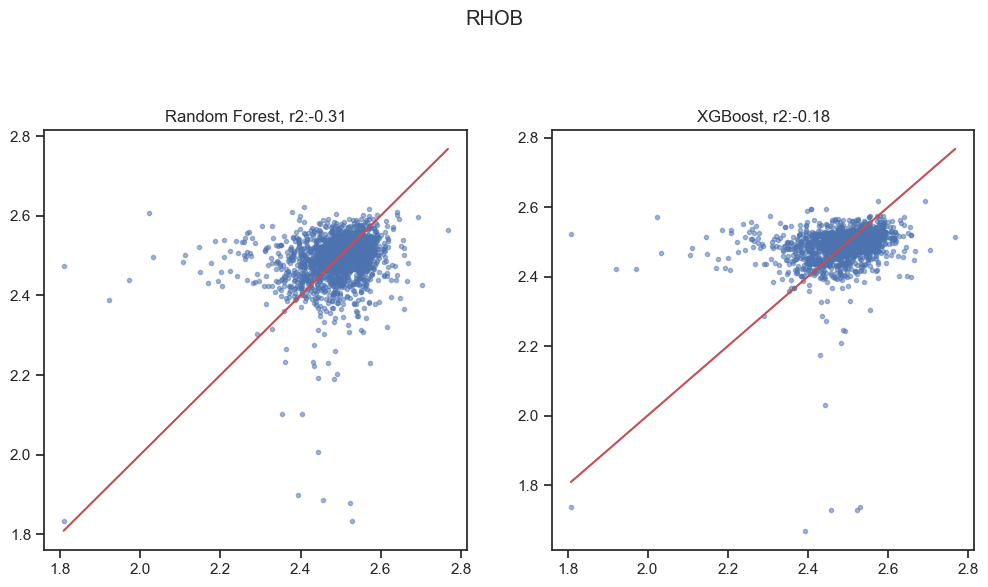

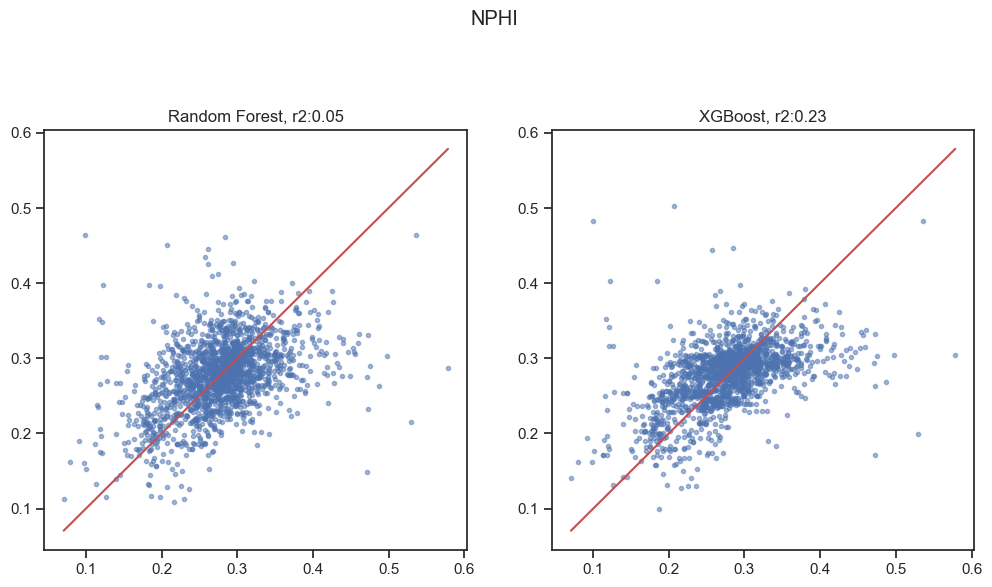

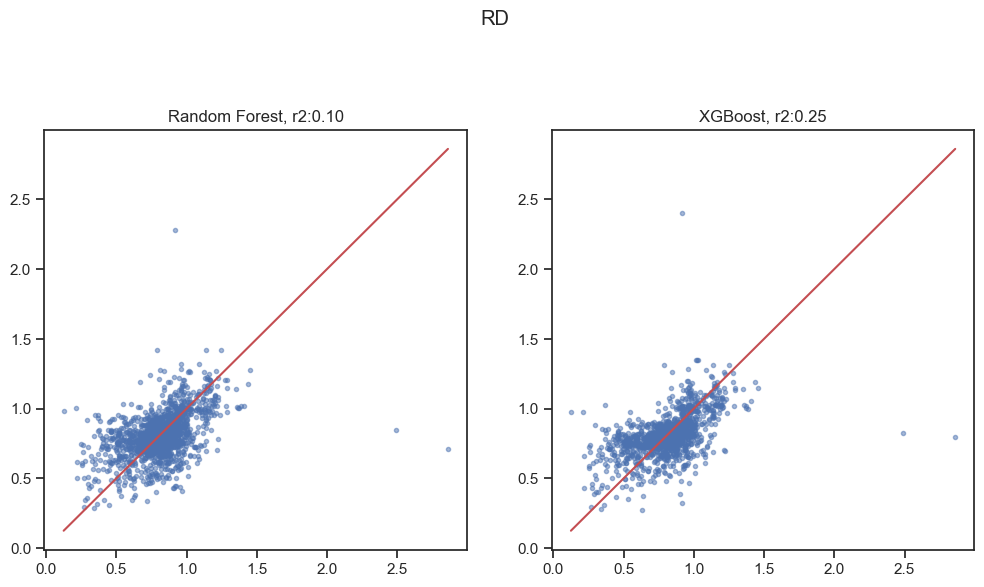

In [41]:
for i in range(3):
    x_min, x_max = val_y[:,i].min(), val_y[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(12,12))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(221)
    plt.plot(val_y[:,i], val_y_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    # plt.xlim(x_min, x_max)
    # plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf3[i]))

    plt.subplot(222)
    plt.plot(val_y[:,i], val_y_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    # plt.xlim(x_min, x_max)
    # plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg3[i]))

In [46]:
from sklearn.linear_model import LinearRegression

In [63]:
lin_reg = LinearRegression()

lin_reg.fit(x_train, y_train)

LinearRegression()

In [64]:
y_val_pred = lin_reg.predict(x_val)

for i in range(3):
    print(r2_score(y_val[:, i], y_val_pred[:, i]))

-0.0024948961753143983
0.06971102255390271
0.17444766066187345


In [52]:
y_train_pred = lin_reg.predict(x_train)

for i in range(3):
    print(r2_score(y_train[:, i], y_train_pred[:, i]))

0.04846849701673417
0.25295068140088717
0.35770893471417764


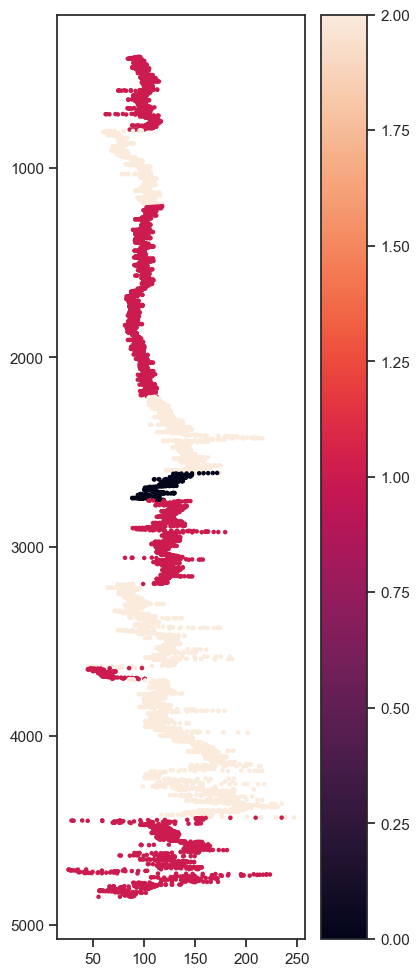

In [137]:
fig, ax1 = plt.subplots(figsize=(4,12))

im = ax1.scatter(Data['GR'], Data['DEPT'], c=Data['Zone'], s=5)
ax1.invert_yaxis()

fig.colorbar(im)


In [193]:
a = 50
test = np.zeros((1, 2))
for i in range(len(Data)//a):
    test = np.concatenate((test, np.array((Data['DEPT'][a*i], np.mean(Data['GR'][a*i:a*i+a]))).reshape(1,2)), axis=0)

In [194]:
test2 = []
for i in range(len(test)-1):
    test2.append(test[i+1,1]-test[i,1])

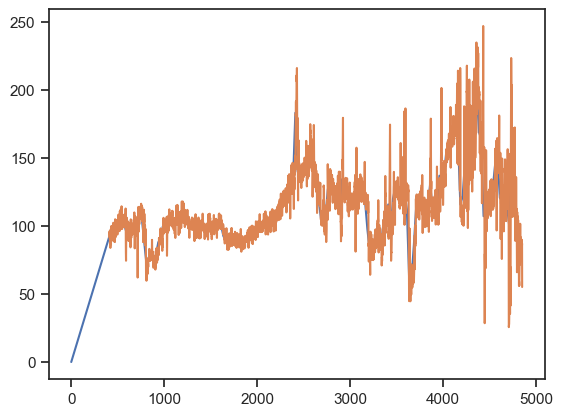

In [197]:
plt.plot(test[:,0],test[:,1])
plt.plot(Data['DEPT'], Data['GR'])

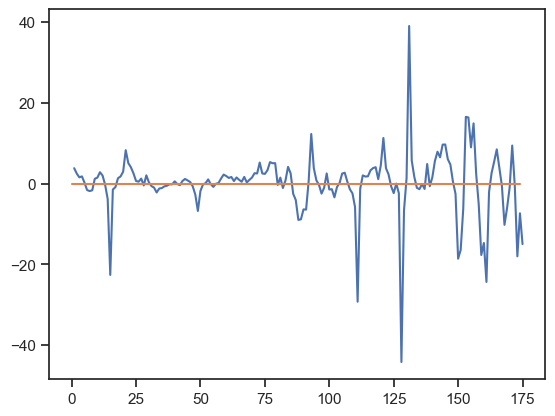

In [240]:
plt.plot(test2)
plt.plot(range(0,175),np.zeros(175))

In [250]:
a = 50
test = []
for i in range(len(window)//a):
    test.append(window[a*i])
test.append(window[-1])

In [251]:
len(test)

178

In [252]:
test2 = []
for i in range(len(test)-1):
    test2.append(test[i+1]-test[i])

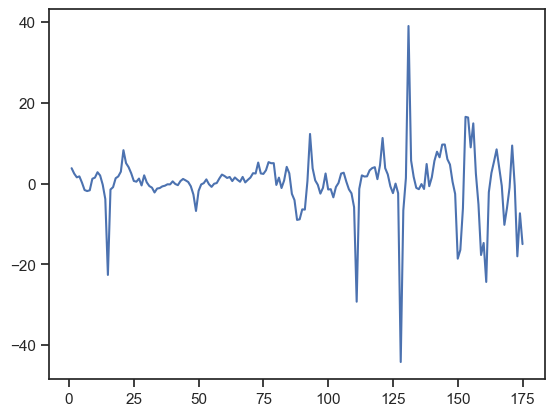

In [207]:
plt.plot(test2)

In [287]:
zone = []
thr = 1
for i in range(len(test2)):
    if test2[i] > thr:
        zone.append(2)
    elif test2[i] < -thr :
        zone.append(0)
    else:
        zone.append(1)

In [288]:
from itertools import chain, repeat
zone_2 = list(chain.from_iterable((repeat(number, a) for number in zone[:-1])))
zone_2 = zone_2 + [zone[-1]] * (len(window)- len(zone_2))

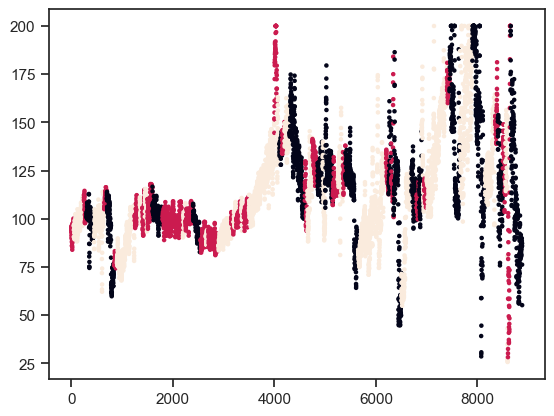

In [291]:
plt.scatter(range(len(window)), per_well[0]['GR'], c= zone_2, s=5)

## Zone 분류 자동화 코딩 (공사중)

In [63]:
# Median filter
window_size = 200
GR_median = []
for i in range(len(per_well[0]['GR'])):
    if i < window_size//2 :
        GR_median.append(np.median(per_well[0]['GR'][:i]))
    elif i > len(per_well[0]) - window_size//2 :
        GR_median.append(np.median(per_well[0]['GR'][i-window_size//2:-1]))
    else:
        GR_median.append(np.median(per_well[0]['GR'][i-window_size//2:i+window_size//2]))

In [52]:
window_size2 = 100
GR_median_2 = []
for i in range(len(GR_median)//window_size2):
    GR_median_2.append(GR_median[window_size2*i])
GR_median_2.append(GR_median[-1])

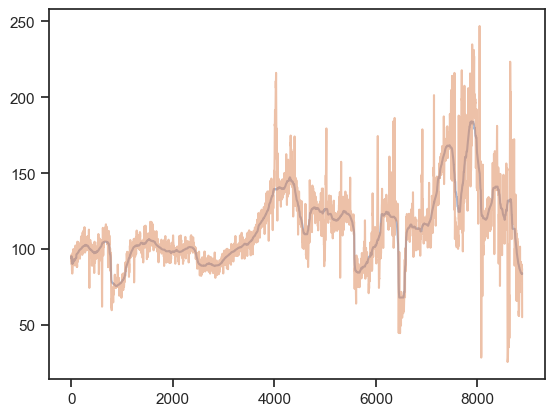

In [64]:
plt.plot(GR_median, alpha=0.5)
plt.plot(per_well[0]['GR'], alpha=0.5)

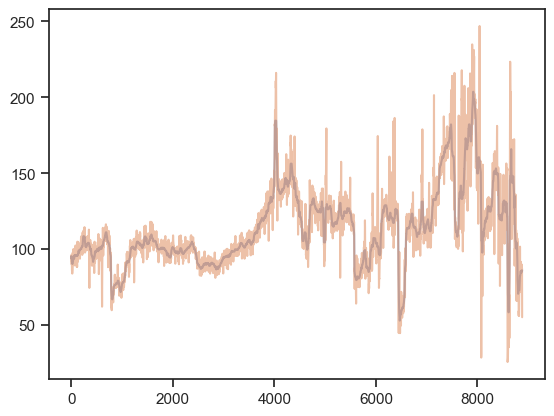

In [62]:
plt.plot(GR_median, alpha=0.5)
plt.plot(per_well[0]['GR'], alpha=0.5)

In [70]:
GR_median[1]

94.007

In [77]:
len(GR_median)

8881

In [79]:
GR_df = []
for i in range(len(GR_median_2)-1):
    GR_df.append(GR_median_2[i+1]-GR_median_2[i])

In [80]:
zone = []
thr = 5
for i in range(len(GR_df)):
    if GR_df[i] > thr:
        zone.append(2)
    elif GR_df[i] < -thr :
        zone.append(0)
    else:
        zone.append(1)

In [81]:
from itertools import chain, repeat
zone_2 = list(chain.from_iterable((repeat(number, window_size2) for number in zone[:-1])))
zone_2 = zone_2 + [zone[-1]] * (len(GR_median)- len(zone_2))

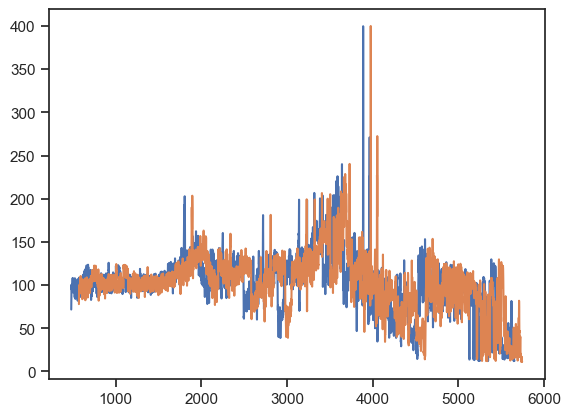

In [85]:
plt.plot(per_well[4]['DEPT'], per_well[4]['GR'])
plt.plot(per_well[6]['DEPT'], per_well[6]['GR'])

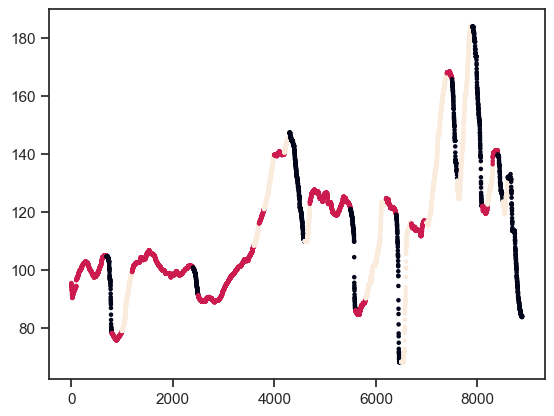

In [82]:
plt.scatter(range(len(GR_median)), GR_median, c= zone_2, s=5)

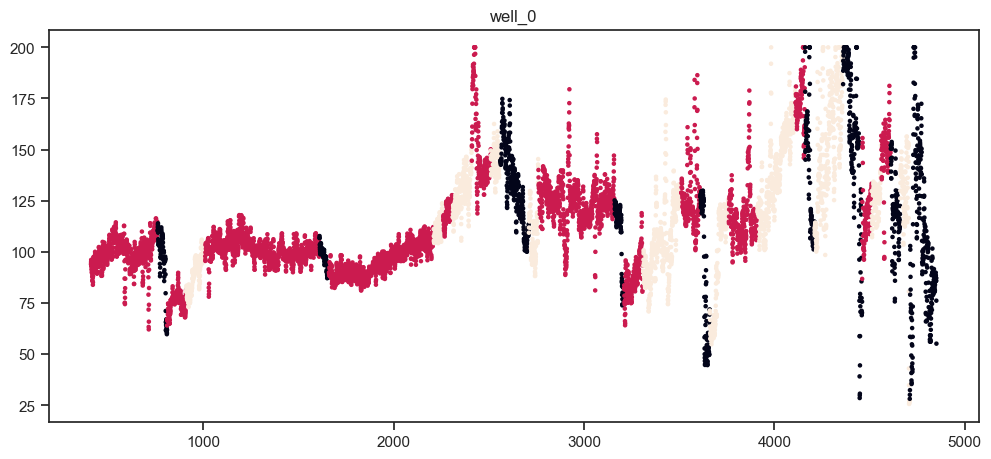

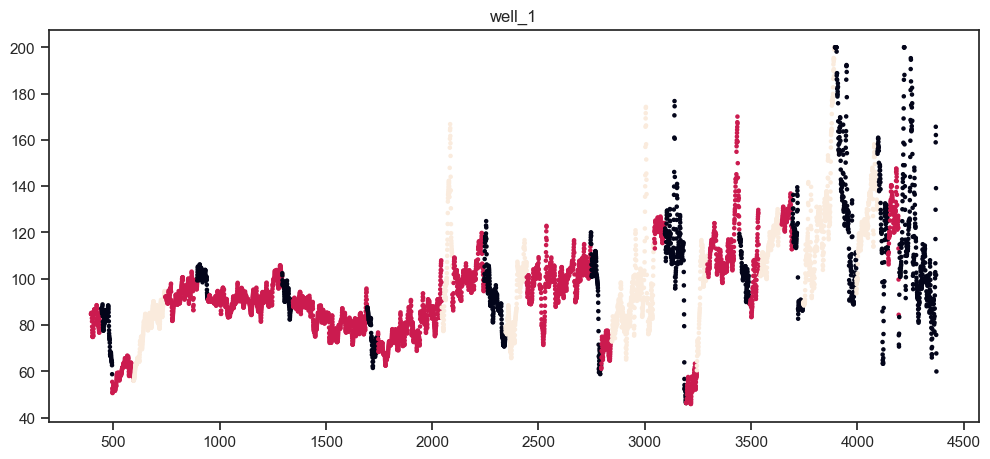

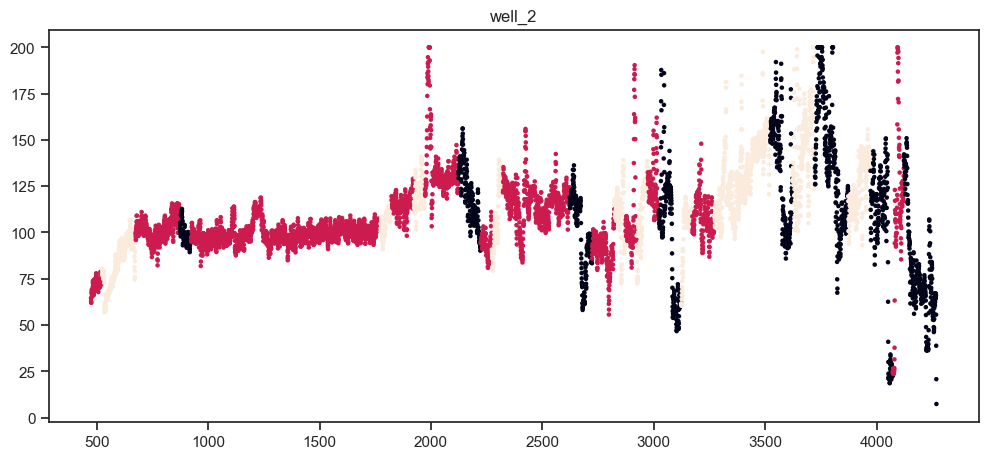

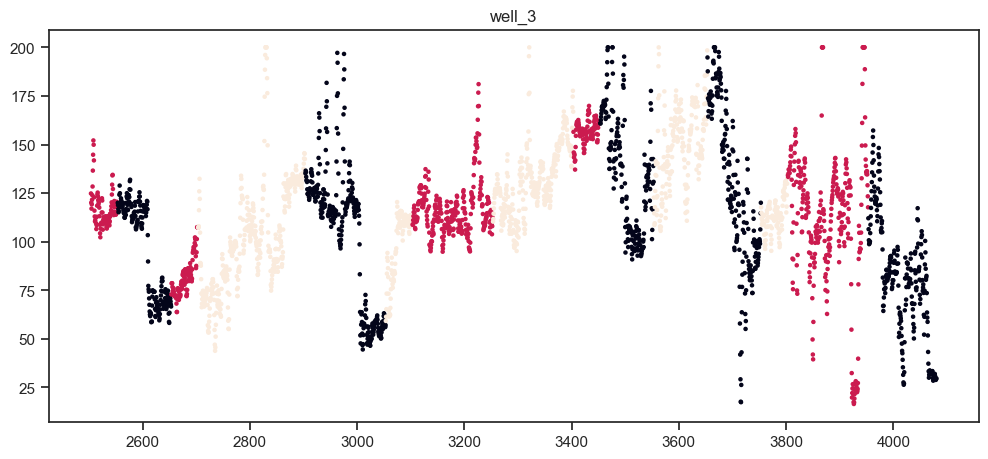

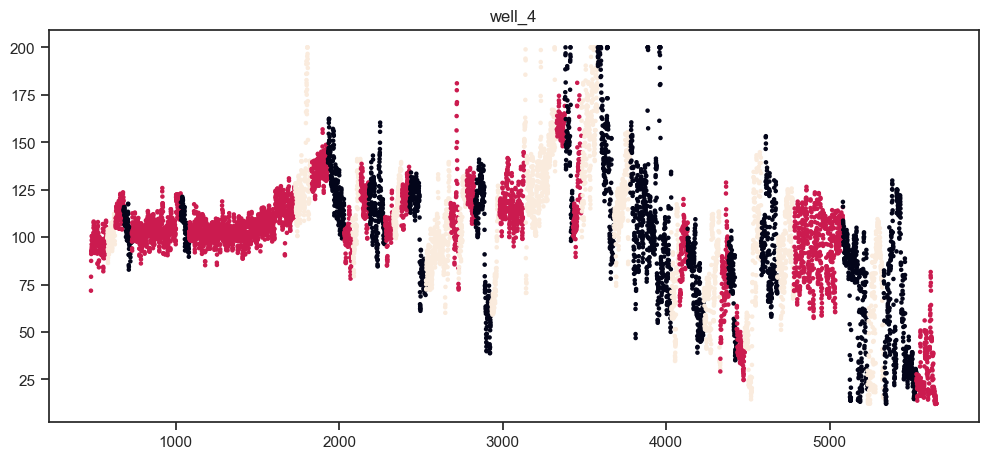

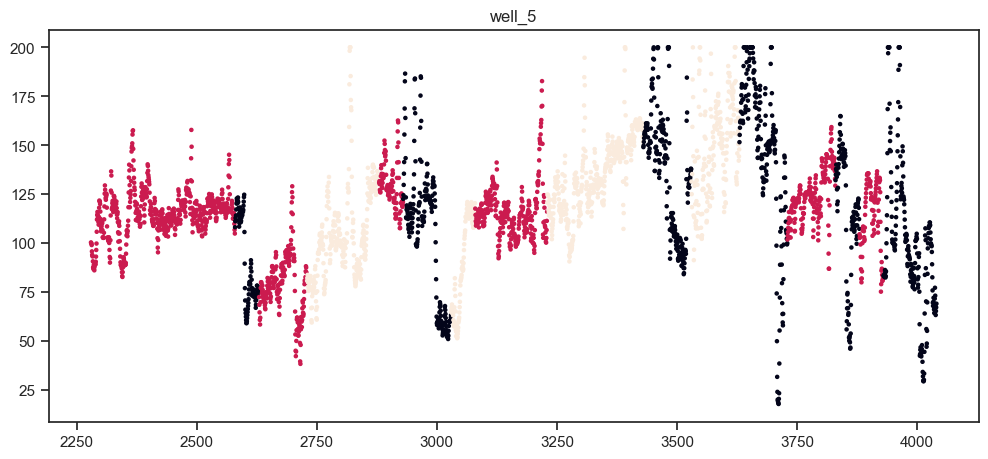

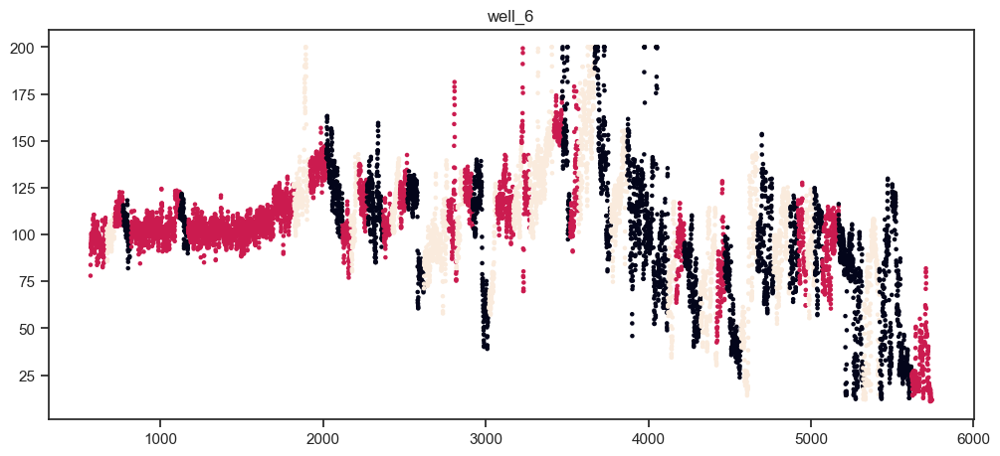

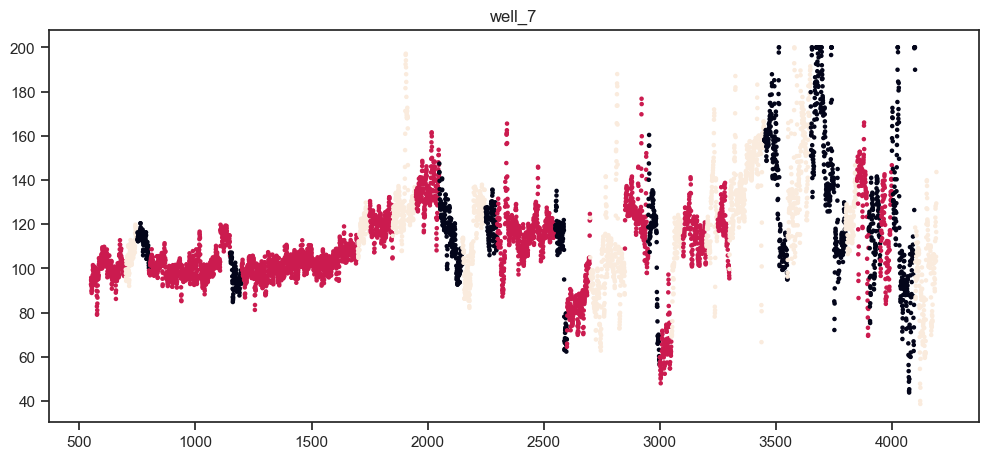

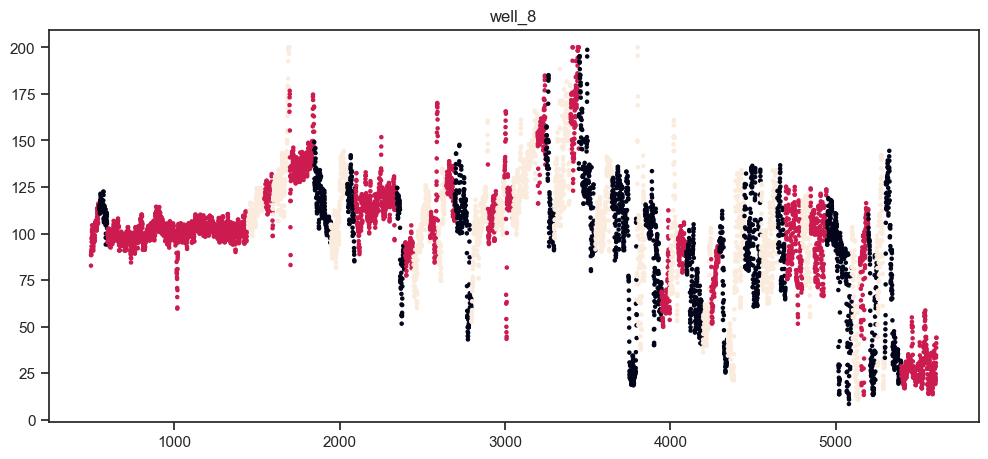

In [400]:
for i, j in enumerate(per_well):
    plt.figure(figsize=(12,54))
    plt.subplot(9, 1, i+1)
    plt.scatter(j['DEPT'], j['GR'], c=j['Zone'], s=5)
    plt.title('well_{}'.format(i))

### Zone에 따른 학습

In [416]:
# 각 유정 데이터를 하나의 데이터 프레임으로 통합
Whole_data = pd.DataFrame()

for i in range(9):
    Whole_data = Whole_data.append(per_well[i])

C:\Users\DELL\AppData\Local\Temp\ipykernel_25072\87703480.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Whole_data = Whole_data.append(per_well[i])
C:\Users\DELL\AppData\Local\Temp\ipykernel_25072\87703480.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Whole_data = Whole_data.append(per_well[i])
C:\Users\DELL\AppData\Local\Temp\ipykernel_25072\87703480.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Whole_data = Whole_data.append(per_well[i])
C:\Users\DELL\AppData\Local\Temp\ipykernel_25072\87703480.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Whole_data = Whole_data.append(per_well[i])
C:\Users\DELL\AppData\Local\

In [417]:
# 전기비저항 검층 로그화
Whole_data['RD'] = np.log10(Whole_data['RD'])

In [418]:
Whole_data_n = Whole_data.loc[Whole_data['Zone'] == 0]
Whole_data_0 = Whole_data.loc[Whole_data['Zone'] == 1]
Whole_data_p = Whole_data.loc[Whole_data['Zone'] == 2]

In [419]:
len(Whole_data_p), len(Whole_data_0), len(Whole_data_p)

(33084, 11100, 33084)

In [420]:
Train_data_n, Val_data_n = train_test_split(Whole_data_n, test_size = .2)
Train_data_0, Val_data_0 = train_test_split(Whole_data_0, test_size = .2)
Train_data_p, Val_data_p = train_test_split(Whole_data_p, test_size = .2)

In [421]:
Feature_name = ['RHOB','NPHI','RD']
x_train_n, y_train_n = Train_data_n['GR'], Train_data_n[Feature_name]
x_val_n, y_val_n = Val_data_n['GR'], Val_data_n[Feature_name]

x_train_0, y_train_0 = Train_data_0['GR'], Train_data_0[Feature_name]
x_val_0, y_val_0 = Val_data_0['GR'], Val_data_0[Feature_name]

x_train_p, y_train_p = Train_data_p['GR'], Train_data_p[Feature_name]
x_val_p, y_val_p = Val_data_p['GR'], Val_data_p[Feature_name]

In [422]:
x_train_n = np.array(x_train_n).reshape(-1,1)
y_train_n = np.array(y_train_n).reshape(-1,3)

x_train_0 = np.array(x_train_0).reshape(-1,1)
y_train_0 = np.array(y_train_0).reshape(-1,3)

x_train_p = np.array(x_train_p).reshape(-1,1)
y_train_p = np.array(y_train_p).reshape(-1,3)

In [423]:
x_val_n = np.array(x_val_n).reshape(-1,1)
y_val_n = np.array(y_val_n).reshape(-1,3)

x_val_0 = np.array(x_val_0).reshape(-1,1)
y_val_0 = np.array(y_val_0).reshape(-1,3)

x_val_p = np.array(x_val_p).reshape(-1,1)
y_val_p = np.array(y_val_p).reshape(-1,3)

In [424]:
from sklearn.linear_model import LinearRegression

In [425]:
rf_reg = RandomForestRegressor()
xg_reg = xgboost.XGBRegressor()
lin_reg = LinearRegression()

y_train_pred_rf = np.zeros((1, 3))
y_train_pred_xg = np.zeros((1, 3))
y_train_pred_lin = np.zeros((1, 3))
y_val_pred_rf = np.zeros((1, 3))
y_val_pred_xg = np.zeros((1, 3))
y_val_pred_lin = np.zeros((1, 3))
for i, j, k in [[x_train_n, y_train_n, x_val_n],[x_train_0,y_train_0, x_val_0],[x_train_p,y_train_p, x_val_p]]:
    rf_reg.fit(i, j)
    xg_reg.fit(i, j)
    lin_reg.fit(i, j)

    y_train_pred_rf = np.concatenate((y_train_pred_rf, rf_reg.predict(i)), axis=0)
    y_train_pred_xg = np.concatenate((y_train_pred_xg, xg_reg.predict(i)), axis=0)
    y_train_pred_lin = np.concatenate((y_train_pred_lin, lin_reg.predict(i)), axis=0)
    y_val_pred_rf = np.concatenate((y_val_pred_rf, rf_reg.predict(k)), axis=0)
    y_val_pred_xg = np.concatenate((y_val_pred_xg, xg_reg.predict(k)), axis=0)
    y_val_pred_lin = np.concatenate((y_val_pred_lin, lin_reg.predict(k)), axis=0)
y_train_pred_rf = np.delete(y_train_pred_rf, 0, axis=0)
y_train_pred_xg = np.delete(y_train_pred_xg, 0, axis=0)
y_train_pred_lin = np.delete(y_train_pred_lin, 0, axis=0)
y_val_pred_rf = np.delete(y_val_pred_rf, 0, axis=0)
y_val_pred_xg = np.delete(y_val_pred_xg, 0, axis=0)
y_val_pred_lin = np.delete(y_val_pred_lin, 0, axis=0)

In [426]:
y_train = np.zeros((1,3))

for i in [y_train_n, y_train_0, y_train_p]:
    y_train = np.concatenate((y_train, i), axis=0)
y_train = np.delete(y_train, 0, axis=0)

y_val = np.zeros((1,3))

for i in [y_val_n, y_val_0, y_val_p]:
    y_val = np.concatenate((y_val, i), axis=0)
y_val = np.delete(y_val, 0, axis=0)

In [427]:
r2_rf_train = []
r2_xg_train = []
for i in range(3):
    r2_rf_train.append(r2_score(y_train[:, i], y_train_pred_rf[:, i]))
    r2_xg_train.append(r2_score(y_train[:, i], y_train_pred_xg[:, i]))

r2_rf_val = []
r2_xg_val = []
for i in range(3):
    r2_rf_val.append(r2_score(y_val[:, i], y_val_pred_rf[:, i]))
    r2_xg_val.append(r2_score(y_val[:, i], y_val_pred_xg[:, i]))

r2_lin_train = []
r2_lin_val = []
for i in range(3):
    r2_lin_train.append(r2_score(y_train[:, i], y_train_pred_lin[:, i]))
    r2_lin_val.append(r2_score(y_val[:, i], y_val_pred_lin[:, i]))

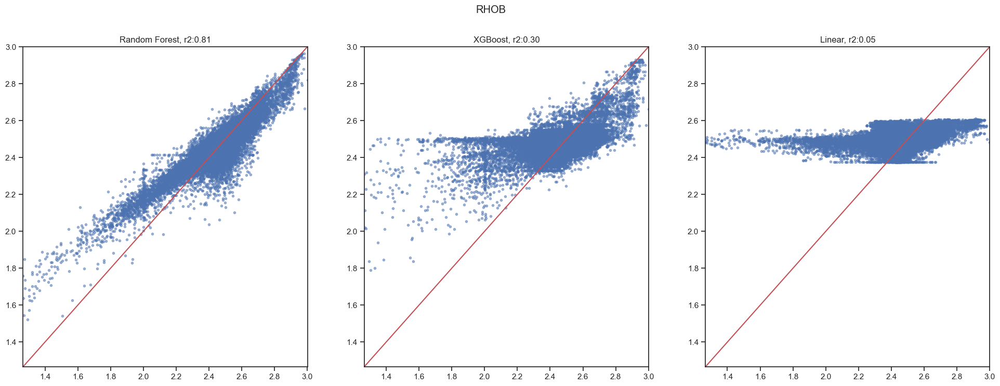

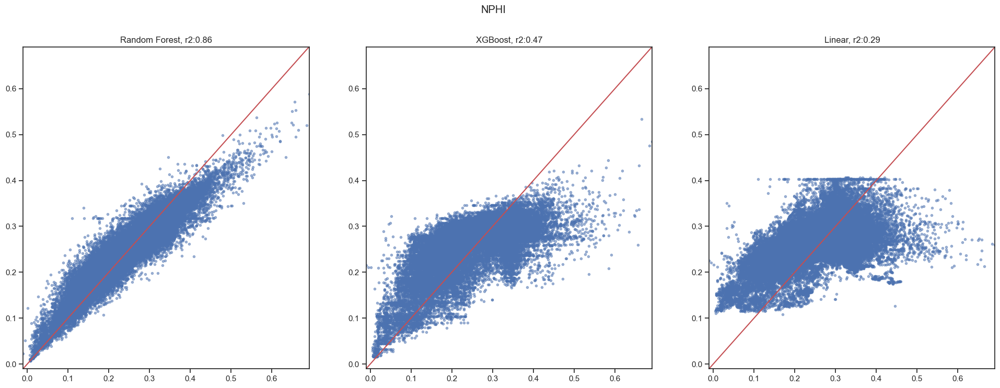

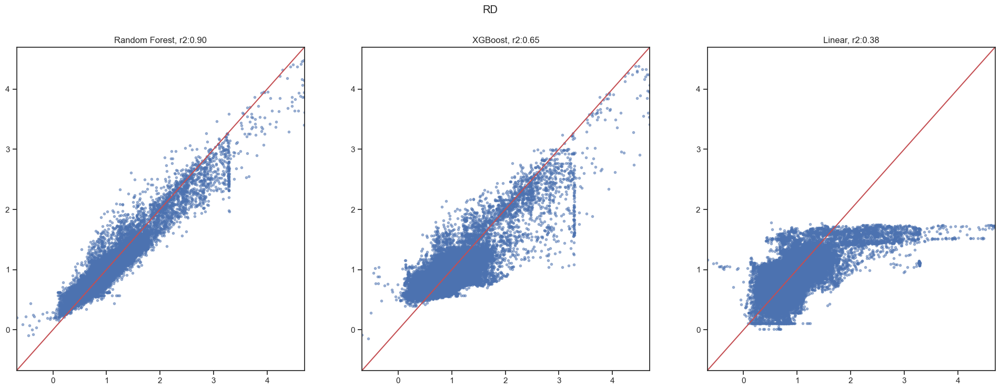

In [428]:
for i in range(3):
    x_min, x_max = y_train[:,i].min(), y_train[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(24,8))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(131)
    plt.plot(y_train[:,i], y_train_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf_train[i]))

    plt.subplot(132)
    plt.plot(y_train[:,i], y_train_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg_train[i]))

    plt.subplot(133)
    plt.plot(y_train[:,i], y_train_pred_lin[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Linear, r2:{:.2f}'.format(r2_lin_train[i]))

    # plt.savefig('Zone/{}_zone O_train.png'.format(Feature_name[i]))

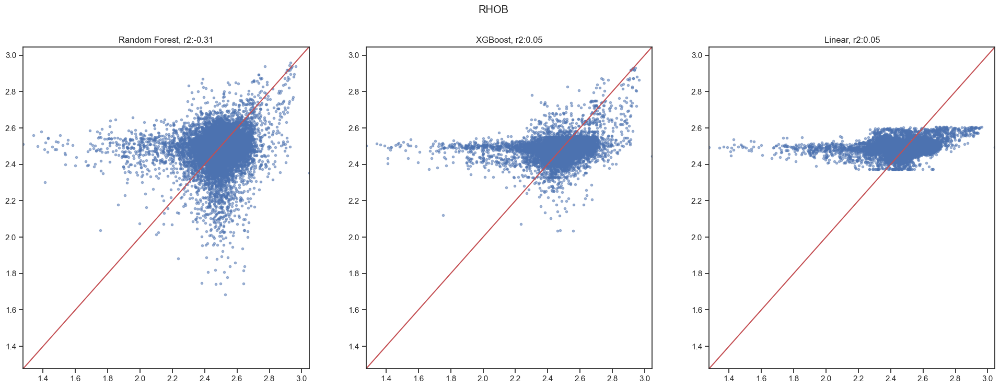

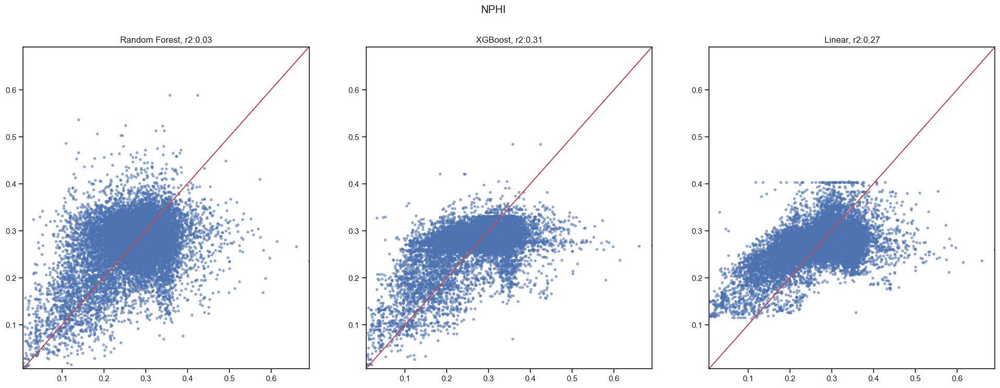

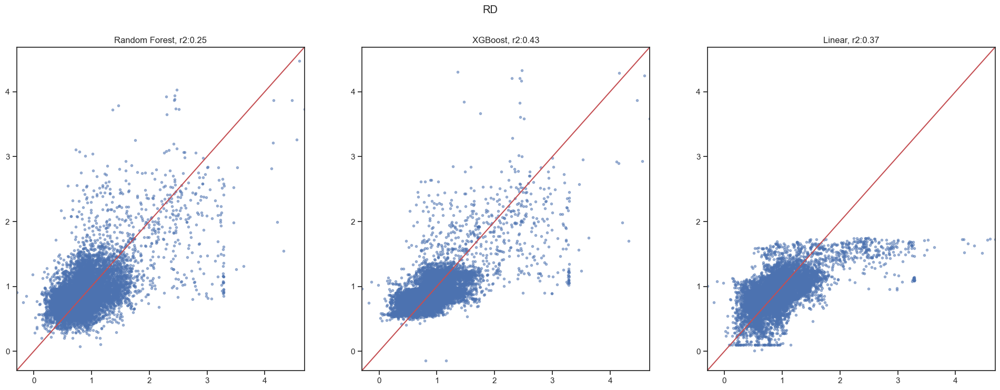

In [429]:
for i in range(3):
    x_min, x_max = y_val[:,i].min(), y_val[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(24,8))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(131)
    plt.plot(y_val[:,i], y_val_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf_val[i]))

    plt.subplot(132)
    plt.plot(y_val[:,i], y_val_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg_val[i]))

    plt.subplot(133)
    plt.plot(y_val[:,i], y_val_pred_lin[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Linear, r2:{:.2f}'.format(r2_lin_val[i]))

    # plt.savefig('Zone/{}_zone O_val.png'.format(Feature_name[i]))

ZONE x

In [38]:
y_train

array([0.2196, 0.1847, 0.31  , ..., 0.2282, 0.2379, 0.1301])

In [49]:
y_train = y_train[:,1]

In [50]:
x_train

array([[ 81.2673],
       [118.4473],
       [101.0301],
       ...,
       [ 96.096 ],
       [122.035 ],
       [ 97.4014]])

In [36]:
rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
rf_reg.fit(x_train, y_train)
y_train_pred_rf = rf_reg.predict(x_val)


In [37]:
r2_score(y_val[:, 1], y_train_pred_rf)

-0.17812277291263956

In [27]:
from sklearn.linear_model import LinearRegression
rf_reg = RandomForestRegressor(n_estimators=100, random_state=100,n_jobs=-1)
xg_reg = xgboost.XGBRegressor()
lin_reg = LinearRegression()

rf_reg.fit(x_train, y_train)
xg_reg.fit(x_train, y_train)
lin_reg.fit(x_train, y_train)

y_train_pred_rf = rf_reg.predict(x_train)
y_train_pred_xg = xg_reg.predict(x_train)
y_train_pred_lin = lin_reg.predict(x_train)

y_val_pred_rf = rf_reg.predict(x_val)
y_val_pred_xg = xg_reg.predict(x_val)
y_val_pred_lin = lin_reg.predict(x_val)



In [28]:
r2_rf_train = []
r2_xg_train = []
for i in range(3):
    r2_rf_train.append(r2_score(y_train[:, i], y_train_pred_rf[:, i]))
    r2_xg_train.append(r2_score(y_train[:, i], y_train_pred_xg[:, i]))

r2_rf_val = []
r2_xg_val = []
for i in range(3):
    r2_rf_val.append(r2_score(y_val[:, i], y_val_pred_rf[:, i]))
    r2_xg_val.append(r2_score(y_val[:, i], y_val_pred_xg[:, i]))

r2_lin_train = []
r2_lin_val = []
for i in range(3):
    r2_lin_train.append(r2_score(y_train[:, i], y_train_pred_lin[:, i]))
    r2_lin_val.append(r2_score(y_val[:, i], y_val_pred_lin[:, i]))

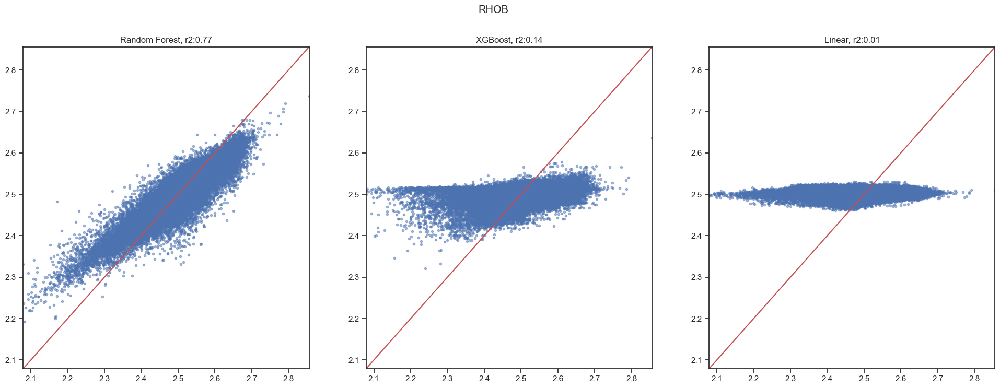

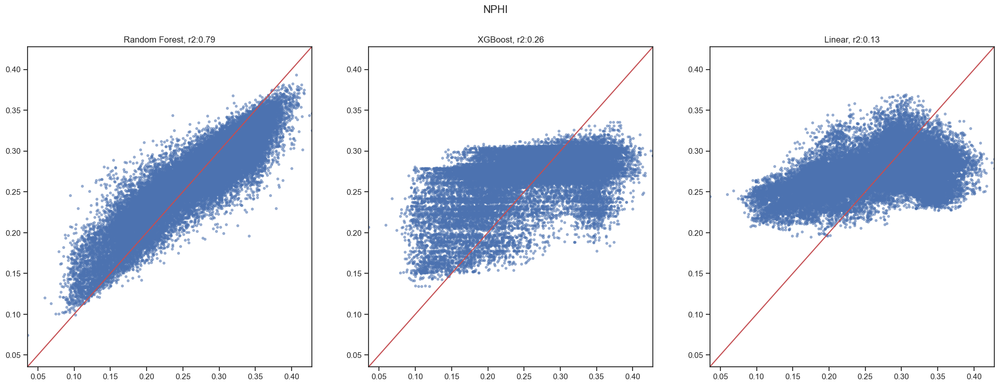

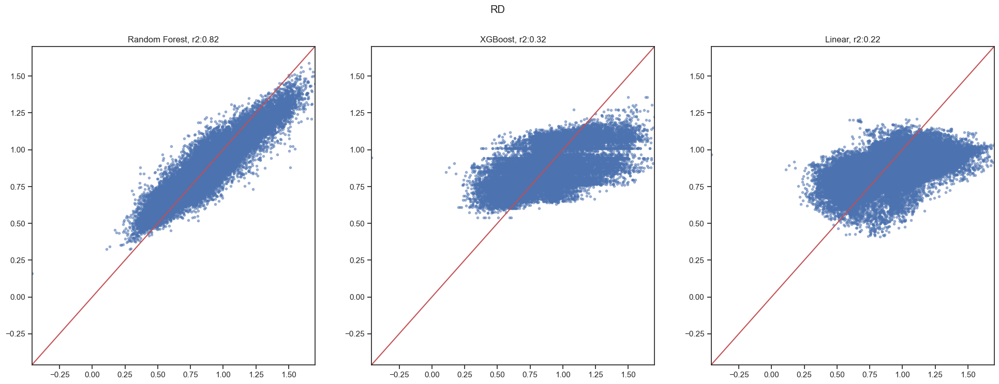

In [29]:
for i in range(3):
    x_min, x_max = y_train[:,i].min(), y_train[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(24,8))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(131)
    plt.plot(y_train[:,i], y_train_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf_train[i]))

    plt.subplot(132)
    plt.plot(y_train[:,i], y_train_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg_train[i]))

    plt.subplot(133)
    plt.plot(y_train[:,i], y_train_pred_lin[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Linear, r2:{:.2f}'.format(r2_lin_train[i]))

    # plt.savefig('Zone/{}_zone X_train.png'.format(Feature_name[i]))

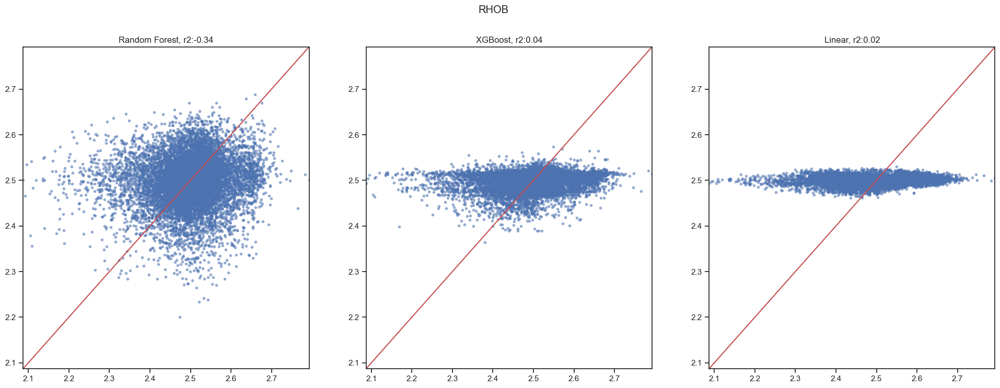

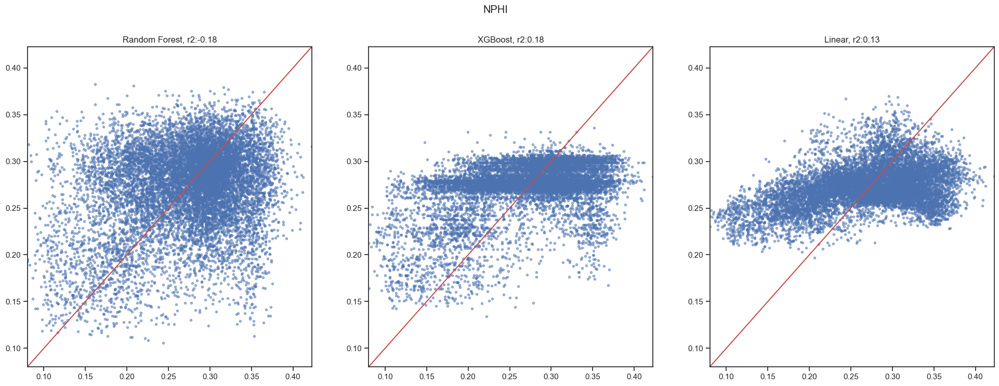

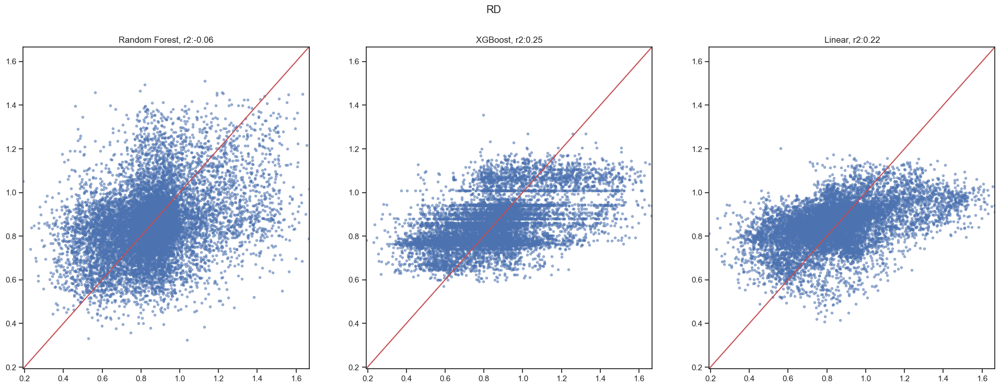

In [30]:
for i in range(3):
    x_min, x_max = y_val[:,i].min(), y_val[:,i].max()
    solid_line = [x_min, x_max]

    plt.figure(figsize=(24,8))

    plt.suptitle('{}'.format(Feature_name[i]))

    plt.subplot(131)
    plt.plot(y_val[:,i], y_val_pred_rf[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Random Forest, r2:{:.2f}'.format(r2_rf_val[i]))

    plt.subplot(132)
    plt.plot(y_val[:,i], y_val_pred_xg[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('XGBoost, r2:{:.2f}'.format(r2_xg_val[i]))

    plt.subplot(133)
    plt.plot(y_val[:,i], y_val_pred_lin[:,i], '.', alpha=0.5)
    plt.plot(solid_line, solid_line, c='r')
    plt.xlim(x_min, x_max)
    plt.ylim(x_min, x_max)
    plt.title('Linear, r2:{:.2f}'.format(r2_lin_val[i]))

    # plt.savefig('Zone/{}_zone X_val.png'.format(Feature_name[i]))

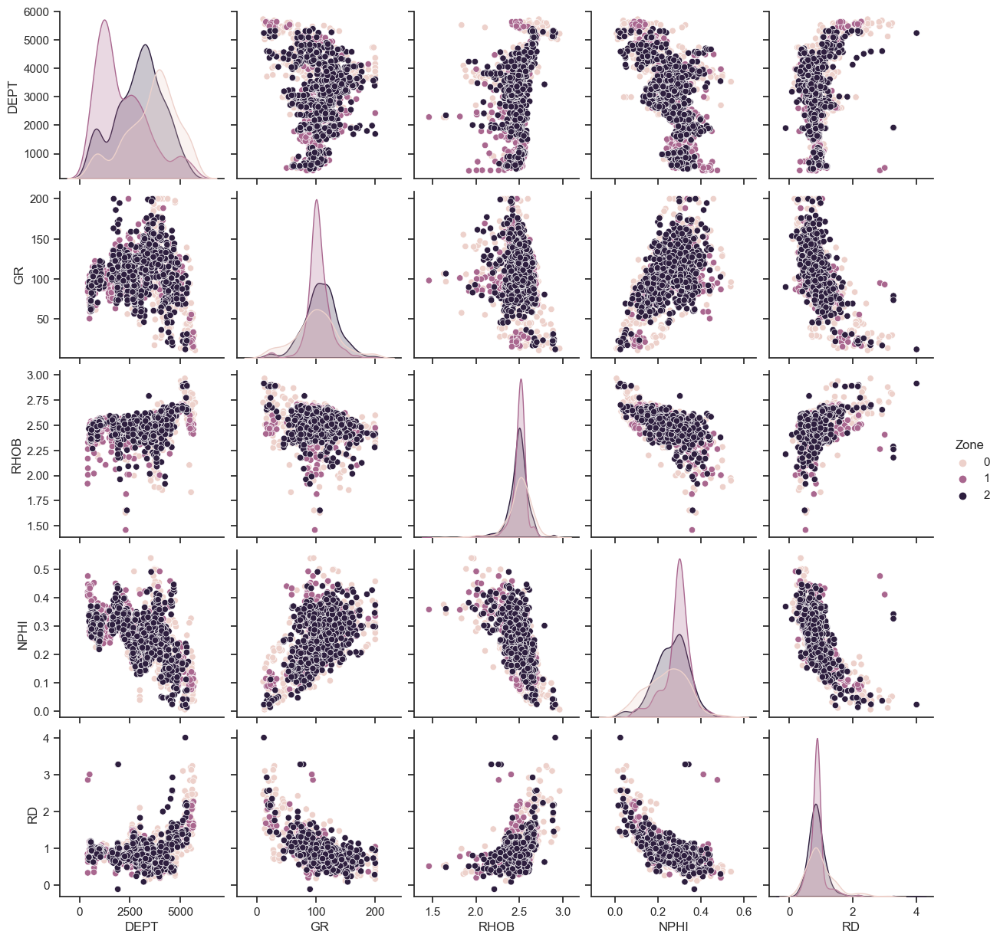

In [374]:
sns.pairplot(Whole_data.sample(2000).sort_values('Zone'), hue='Zone')

In [17]:
Whole_data.shape

(69304, 5)